In [2]:
import numpy as np
import helper_functions as functions
import json

import pandas as pd
import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline
import seaborn as sns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

from collections import Counter
import random
#import texthero as hero


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA

from numpy import mean
from numpy import std

from sklearn.neighbors import KNeighborsClassifier

from sklearn.feature_extraction.text import CountVectorizer

#from simcse import SimCSE


from sklearn.manifold import TSNE
import matplotlib.cm as cm

In [3]:
with open('young_subjects_full_study_json_list_march23.json', "r") as read_file:
    data_json_list = json.load(read_file)

In [4]:
len(data_json_list)

17335

In [5]:
print(data_json_list[0])

{'subjectIndex': 63, 'sessionIndex': 1, 'listIndex': 0, 'listLength_studyPhase': 16, 'listLength_recallPhase': 7, 'wordIndices_studyPhase': [737, 203, 913, 382, 31, 733, 1618, 391, 1171, 1258, 931, 1221, 1372, 291, 1550, 1279], 'serialPositions_studyPhase': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15], 'actualWords_studyPhase': ['INFANT', 'BUTCHER', 'MONUMENT', 'CORPORATION', 'APE', 'IDOL', 'WITNESS', 'COURT', 'RAZOR', 'SCULPTURE', 'MULE', 'SADDLE', 'STAPLER', 'CHEMICAL', 'VAULT', 'SHEET'], 'wordIndices_recallPhase': [1279, 291, 1618, 203, 913, 737, 1258], 'serialPositions_recallPhase': [15, 13, 6, 1, 2, 0, 9], 'actualWords_recallPhase': ['SHEET', 'CHEMICAL', 'WITNESS', 'BUTCHER', 'MONUMENT', 'INFANT', 'SCULPTURE']}


In [6]:
print(data_json_list[0]['actualWords_studyPhase'])

['INFANT', 'BUTCHER', 'MONUMENT', 'CORPORATION', 'APE', 'IDOL', 'WITNESS', 'COURT', 'RAZOR', 'SCULPTURE', 'MULE', 'SADDLE', 'STAPLER', 'CHEMICAL', 'VAULT', 'SHEET']


In [7]:
print(data_json_list[0]['actualWords_recallPhase'])

['SHEET', 'CHEMICAL', 'WITNESS', 'BUTCHER', 'MONUMENT', 'INFANT', 'SCULPTURE']


### TASK1 - FOR TRIALS ====> Only recall index flags

In [8]:
### TRYING WITH JUST ALL subjects
data_json_list_subset = []
for i in data_json_list:
    if len(i)>0:
        data_json_list_subset.append(i)

### TRYING WITH JUST 10 subjects
# ids_subset = [267, 87, 151, 90, 122, 242, 110, 92, 241, 194]
# data_json_list_subset = []

# for i in data_json_list:
#     if len(i)>0:
#         if i["subjectIndex"] in ids_subset:
#             data_json_list_subset.append(i)

In [9]:
len(data_json_list_subset)

17335

In [13]:
bigList = []

for i in data_json_list_subset:
    smallList = [i["subjectIndex"] , i["sessionIndex"] , i["listIndex"]]
    recall_flags = [0]*16
    recall_indices = list(set(i["serialPositions_recallPhase"]))
    for j in recall_indices:
        if j>=0:
            if j==0 or j==16:
                recall_flags[0]=1
            else:
                recall_flags[j]=1 
    smallList += recall_flags
    bigList.append(smallList)
    
print(len(bigList),len(bigList[0]))    
    
cols = ['subjectIndex',
        'sessionIndex',
        'listIndex',
        'recalled_w1',
        'recalled_w2',
        'recalled_w3',
        'recalled_w4',
        'recalled_w5',
        'recalled_w6',
        'recalled_w7',
        'recalled_w8',
        'recalled_w9',
        'recalled_w10',
        'recalled_w11',
        'recalled_w12',
        'recalled_w13',
        'recalled_w14',
        'recalled_w15',
        'recalled_w16']

df_Allsubjects = pd.DataFrame(bigList, columns = cols)

print(df_Allsubjects.shape)

17335 19
(17335, 19)


In [14]:
df_Allsubjects.head(10)

,subjectIndex,sessionIndex,listIndex,recalled_w1,recalled_w2,recalled_w3,recalled_w4,recalled_w5,recalled_w6,recalled_w7,recalled_w8,recalled_w9,recalled_w10,recalled_w11,recalled_w12,recalled_w13,recalled_w14,recalled_w15,recalled_w16
0,63,1,0,1,1,1,0,0,0,1,0,0,1,0,0,0,1,0,1
1,63,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,1
2,63,1,2,0,1,1,0,1,1,1,0,0,1,0,0,0,0,1,1
3,63,1,3,1,1,0,0,0,0,0,0,0,0,1,0,1,1,0,1
4,63,1,4,0,0,0,1,0,1,1,1,0,1,0,1,1,1,1,1
5,63,1,5,0,0,0,0,0,0,0,1,1,0,0,0,0,1,1,1
6,63,1,6,1,1,1,1,0,0,0,0,0,1,1,0,1,0,0,1
7,63,1,7,0,0,0,0,1,1,0,1,1,1,1,1,1,1,1,1
8,63,1,8,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1
9,63,1,9,1,1,1,0,1,0,1,0,1,1,1,0,0,1,1,1


In [15]:
### each subject has 6 sessions , each session has 16 trials
### there are 186 subjects ===>  186*6*16

df_Allsubjects.head(20)

,subjectIndex,sessionIndex,listIndex,recalled_w1,recalled_w2,recalled_w3,recalled_w4,recalled_w5,recalled_w6,recalled_w7,recalled_w8,recalled_w9,recalled_w10,recalled_w11,recalled_w12,recalled_w13,recalled_w14,recalled_w15,recalled_w16
0,63,1,0,1,1,1,0,0,0,1,0,0,1,0,0,0,1,0,1
1,63,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,1
2,63,1,2,0,1,1,0,1,1,1,0,0,1,0,0,0,0,1,1
3,63,1,3,1,1,0,0,0,0,0,0,0,0,1,0,1,1,0,1
4,63,1,4,0,0,0,1,0,1,1,1,0,1,0,1,1,1,1,1
5,63,1,5,0,0,0,0,0,0,0,1,1,0,0,0,0,1,1,1
6,63,1,6,1,1,1,1,0,0,0,0,0,1,1,0,1,0,0,1
7,63,1,7,0,0,0,0,1,1,0,1,1,1,1,1,1,1,1,1
8,63,1,8,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1
9,63,1,9,1,1,1,0,1,0,1,0,1,1,1,0,0,1,1,1


In [10]:
df_Allsubjects.groupby(['subjectIndex']).size()

subjectIndex
63     96
64     96
65     96
66     96
67     96
68     64
69     96
70     96
73     96
74     96
75     96
76     96
77     96
79     96
80     32
81     96
82     96
84     96
85     96
86     96
87     96
88     96
89     96
90     96
91     96
92     96
93     96
94     96
95     96
96     94
97     32
98     96
99     96
100    96
101    96
102    96
103    96
104    96
105    96
106    96
107    96
108    96
109    79
110    96
111    96
112    96
113    96
114    96
115    96
116    64
117    96
118    96
119    96
120    96
121    64
122    96
123    96
124    96
125    96
126    48
127    96
128    96
129    80
130    96
131    96
132    96
133    96
134    96
135    96
136    96
137    96
138    96
139    96
140    96
141    96
142    96
143    96
144    96
145    96
146    96
147    96
148    96
149    96
150    96
151    96
153    96
155    96
158    45
159    96
161    80
166    96
167    32
168    96
174    96
181    80
184    96
185    96
186    96
187    

In [21]:
df_Allsubjects.groupby(['subjectIndex','sessionIndex'])

In [22]:
### selecting subjects with exactly 96 rows (6x16)

dict_totaltrials_per_subject = df_Allsubjects.groupby(['subjectIndex']).size().to_dict()
print(dict_totaltrials_per_subject)

{63: 96, 64: 96, 65: 96, 66: 96, 67: 96, 68: 64, 69: 96, 70: 96, 73: 96, 74: 96, 75: 96, 76: 96, 77: 96, 79: 96, 80: 32, 81: 96, 82: 96, 84: 96, 85: 96, 86: 96, 87: 96, 88: 96, 89: 96, 90: 96, 91: 96, 92: 96, 93: 96, 94: 96, 95: 96, 96: 94, 97: 32, 98: 96, 99: 96, 100: 96, 101: 96, 102: 96, 103: 96, 104: 96, 105: 96, 106: 96, 107: 96, 108: 96, 109: 79, 110: 96, 111: 96, 112: 96, 113: 96, 114: 96, 115: 96, 116: 64, 117: 96, 118: 96, 119: 96, 120: 96, 121: 64, 122: 96, 123: 96, 124: 96, 125: 96, 126: 48, 127: 96, 128: 96, 129: 80, 130: 96, 131: 96, 132: 96, 133: 96, 134: 96, 135: 96, 136: 96, 137: 96, 138: 96, 139: 96, 140: 96, 141: 96, 142: 96, 143: 96, 144: 96, 145: 96, 146: 96, 147: 96, 148: 96, 149: 96, 150: 96, 151: 96, 153: 96, 155: 96, 158: 45, 159: 96, 161: 80, 166: 96, 167: 32, 168: 96, 174: 96, 181: 80, 184: 96, 185: 96, 186: 96, 187: 96, 188: 96, 189: 96, 190: 94, 191: 96, 192: 96, 193: 96, 194: 96, 195: 96, 196: 96, 197: 96, 198: 96, 199: 96, 200: 96, 201: 96, 202: 96, 207: 9

In [23]:
subjects_with_96_complete_trials = []
for k,v in dict_totaltrials_per_subject.items():
    if v==96:
        subjects_with_96_complete_trials.append(k)
        
print(len(subjects_with_96_complete_trials))

168


In [24]:
X = df_Allsubjects.iloc[:,3:].values
y = df_Allsubjects.iloc[:,0].values

In [25]:
tsne = TSNE(n_components=2, perplexity=30, n_iter=5000, verbose=3)

In [26]:
projections_tsne = tsne.fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 17335 samples in 0.001s...
[t-SNE] Computed neighbors for 17335 samples in 8.175s...
[t-SNE] Computed conditional probabilities for sample 1000 / 17335
[t-SNE] Computed conditional probabilities for sample 2000 / 17335
[t-SNE] Computed conditional probabilities for sample 3000 / 17335
[t-SNE] Computed conditional probabilities for sample 4000 / 17335
[t-SNE] Computed conditional probabilities for sample 5000 / 17335
[t-SNE] Computed conditional probabilities for sample 6000 / 17335
[t-SNE] Computed conditional probabilities for sample 7000 / 17335
[t-SNE] Computed conditional probabilities for sample 8000 / 17335
[t-SNE] Computed conditional probabilities for sample 9000 / 17335
[t-SNE] Computed conditional probabilities for sample 10000 / 17335
[t-SNE] Computed conditional probabilities for sample 11000 / 17335
[t-SNE] Computed conditional probabilities for sample 12000 / 17335
[t-SNE] Computed conditional probabilities for sam

In [27]:
type(projections_tsne)

numpy.ndarray

In [28]:
projections_tsne.shape

(17335, 2)

In [29]:
label = y
totalSubjects = df_Allsubjects.subjectIndex.nunique()
colors = cm.rainbow(np.linspace(0, 1, totalSubjects))

totalSubjects

186

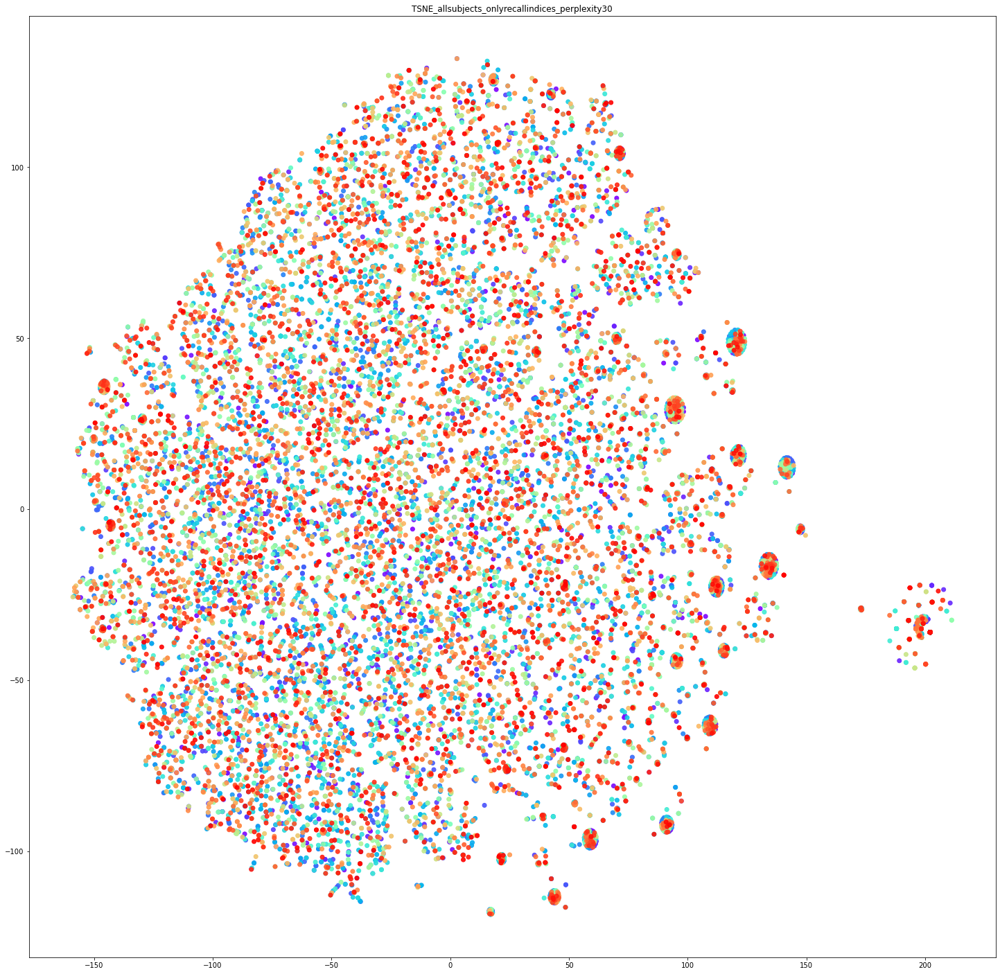

In [30]:
plt.figure(figsize=(25, 25))
plt.scatter(projections_tsne[:, 0],
            projections_tsne[:, 1], 
            c=label, cmap=matplotlib.colors.ListedColormap(colors),alpha=0.9)
plt.title("TSNE_allsubjects_onlyrecallindices_perplexity30")
plt.show()

In [ ]:
### selecting random 10 subjects 10 times to check stability
### we see few users have this pattern

0 = [283, 68, 250, 293, 84, 214, 234, 285, 140, 215, 272, 149, 267, 138, 279, 214, 116, 65, 90, 254]


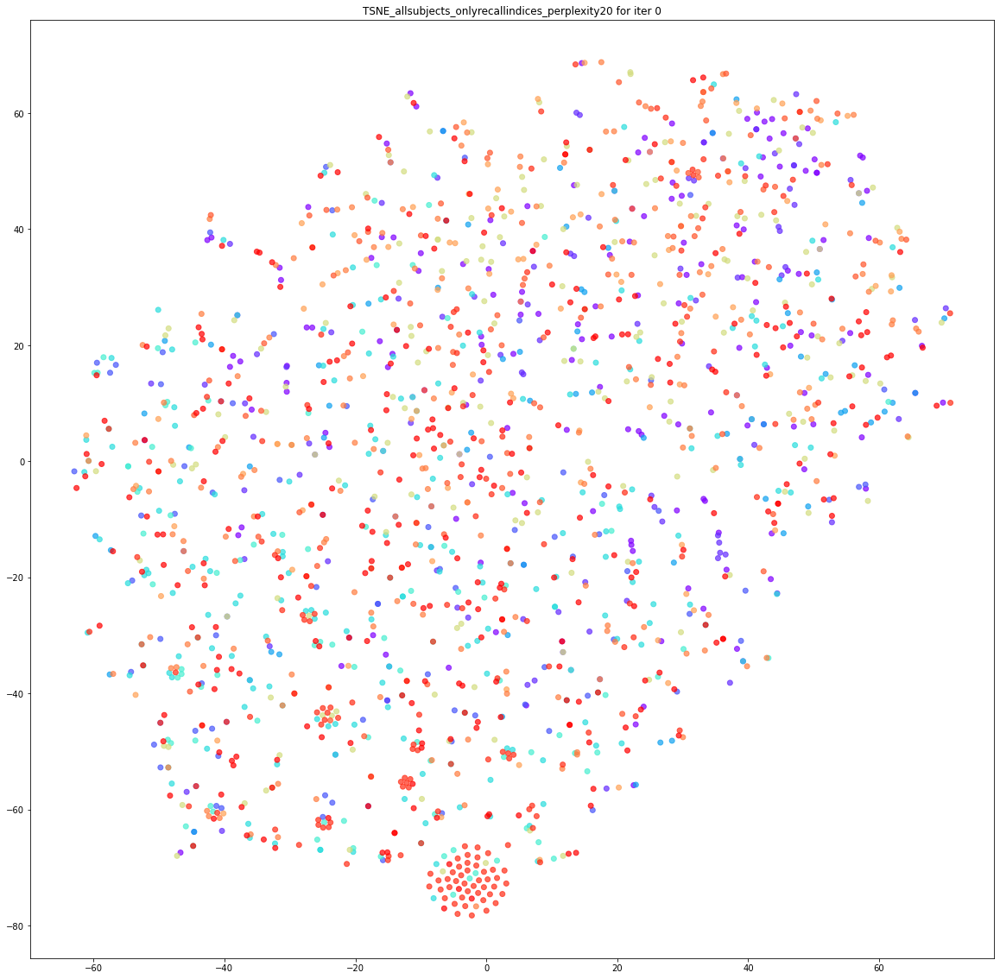

1 = [143, 211, 269, 199, 243, 128, 114, 64, 261, 79, 276, 270, 144, 290, 274, 192, 96, 92, 246, 143]


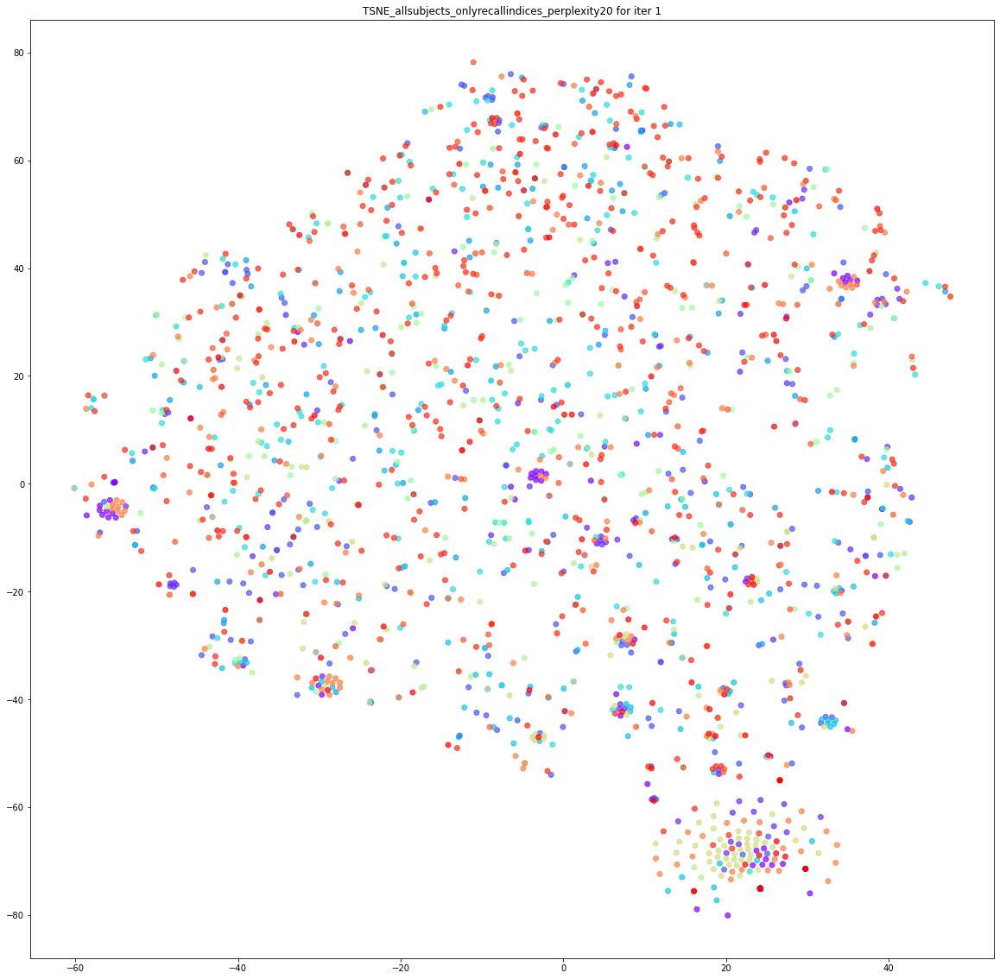

2 = [242, 187, 153, 132, 265, 141, 63, 121, 235, 277, 65, 288, 107, 189, 264, 112, 235, 119, 199, 107]


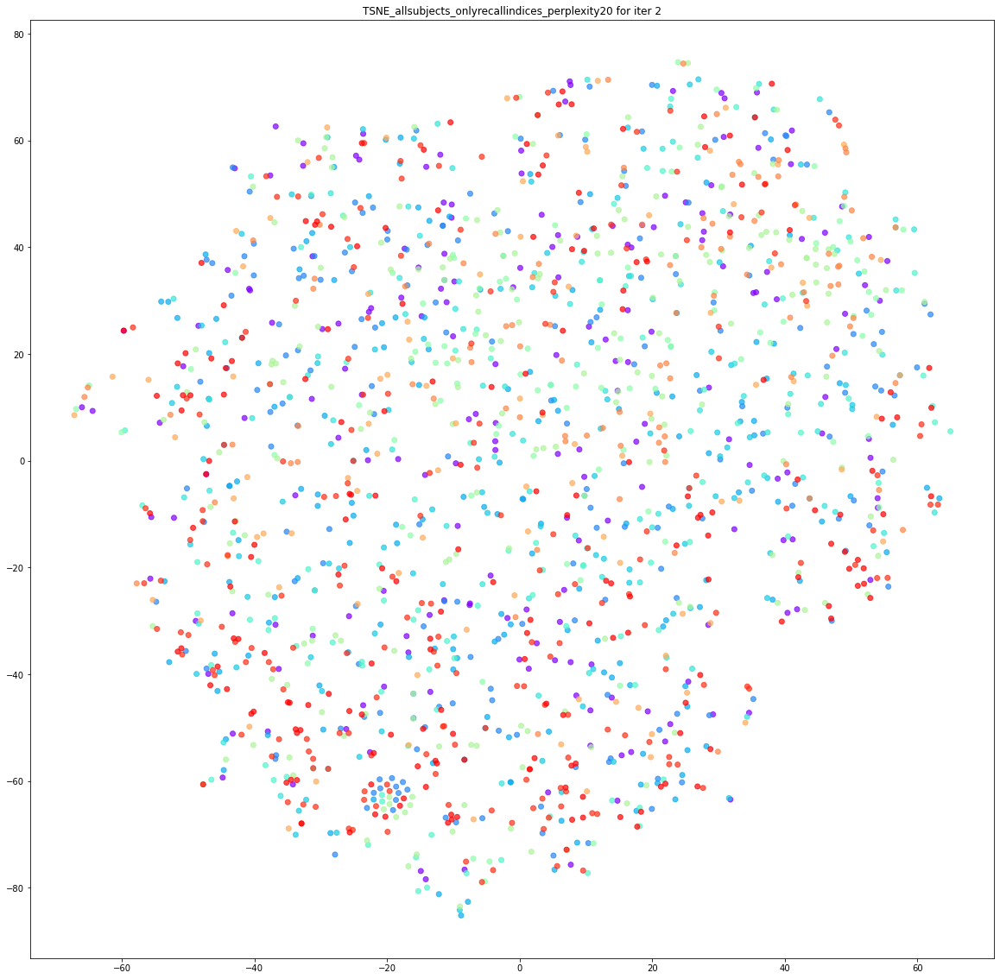

3 = [74, 273, 190, 196, 192, 247, 102, 147, 159, 184, 282, 277, 104, 246, 144, 107, 118, 109, 98, 158]


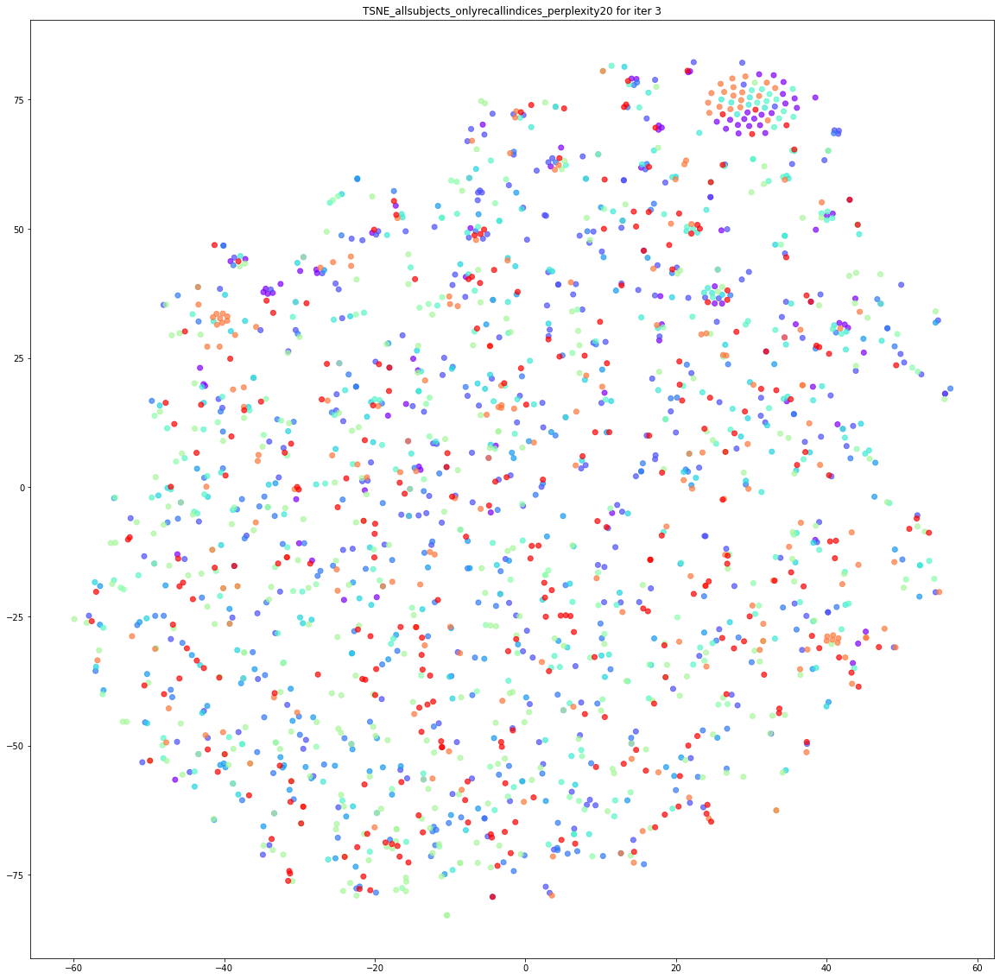

4 = [245, 91, 67, 116, 211, 193, 284, 260, 64, 161, 242, 286, 144, 148, 130, 188, 65, 92, 111, 138]


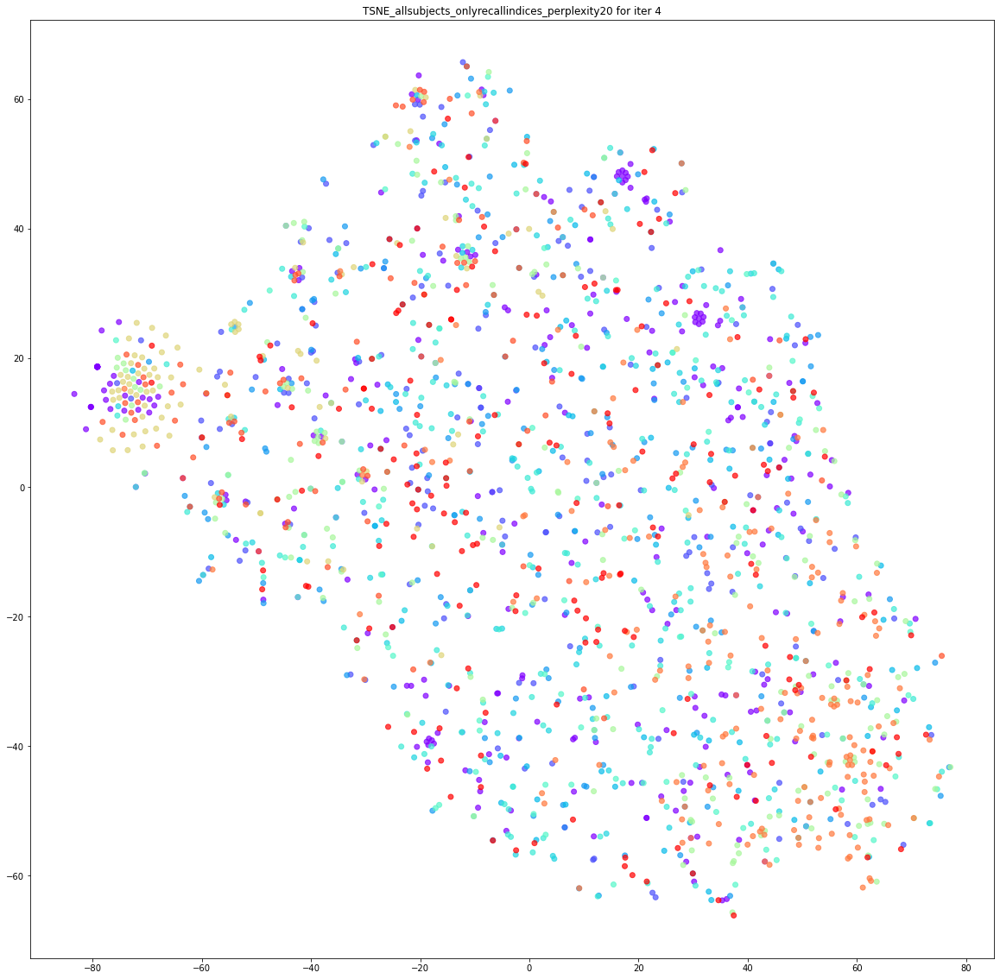

5 = [211, 256, 89, 271, 252, 132, 151, 86, 132, 73, 130, 107, 131, 99, 63, 139, 270, 106, 118, 271]


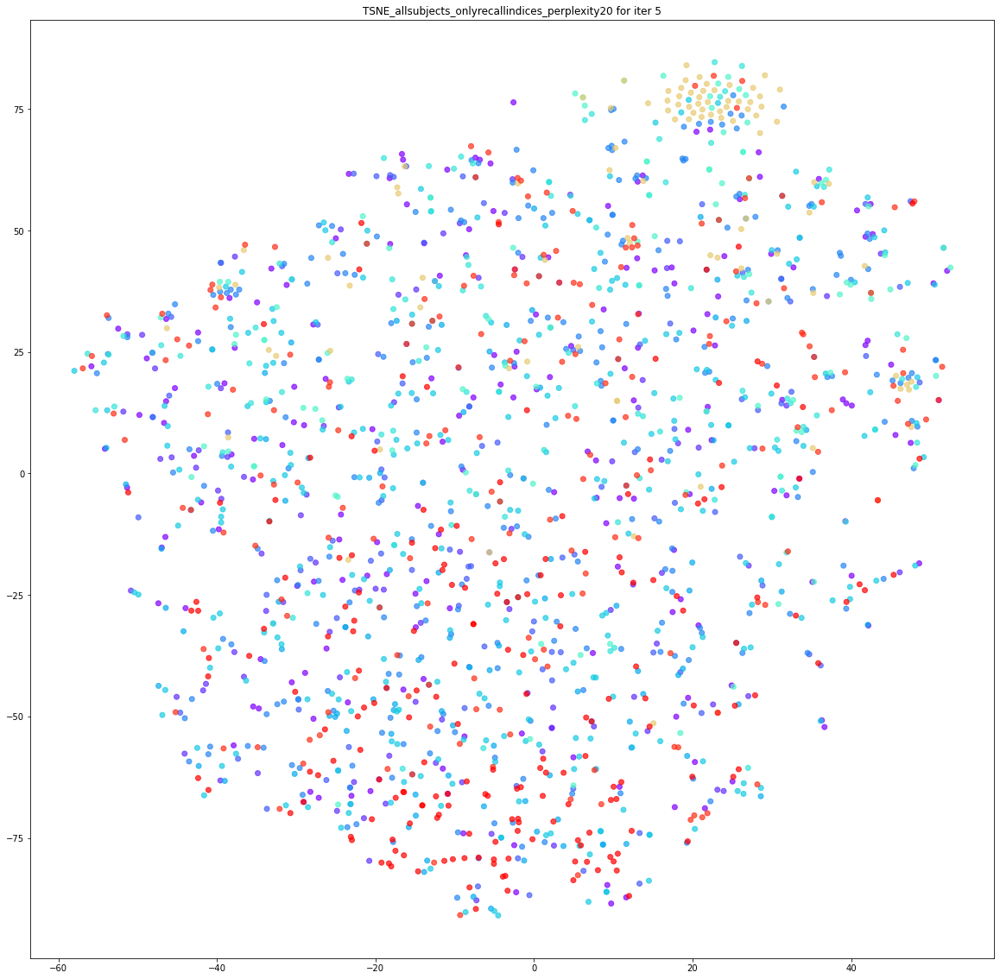

6 = [121, 148, 120, 244, 249, 151, 293, 200, 187, 64, 210, 251, 123, 291, 143, 125, 141, 242, 121, 274]


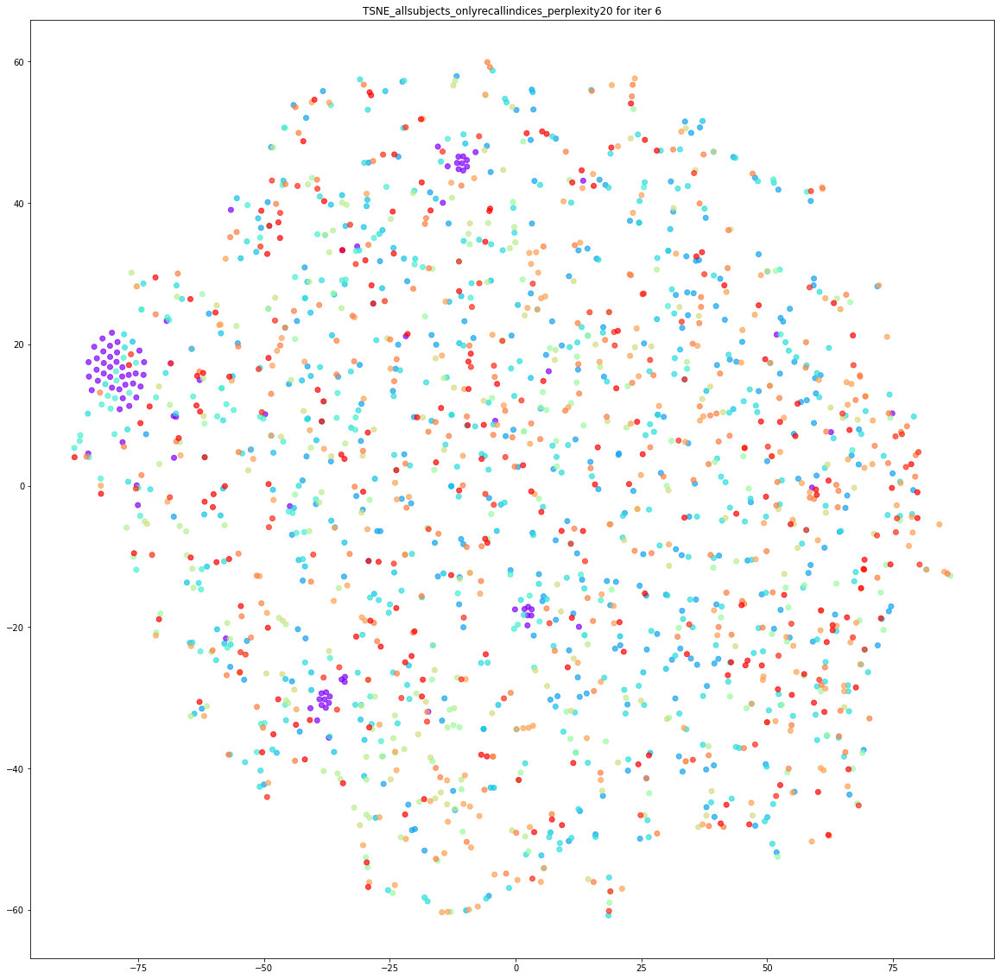

7 = [133, 70, 79, 91, 90, 185, 140, 64, 116, 77, 142, 98, 190, 168, 130, 189, 245, 230, 99, 237]


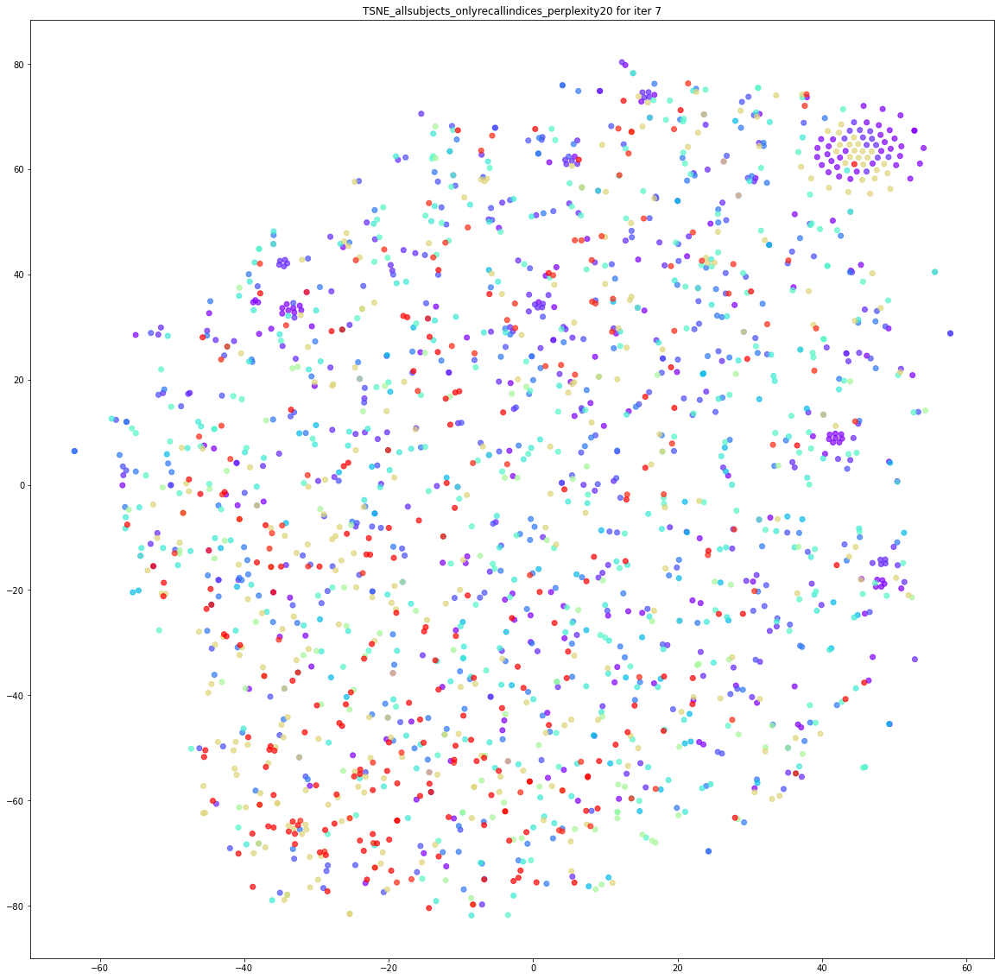

8 = [209, 282, 258, 95, 211, 90, 114, 131, 215, 196, 254, 120, 233, 139, 74, 147, 247, 130, 136, 95]


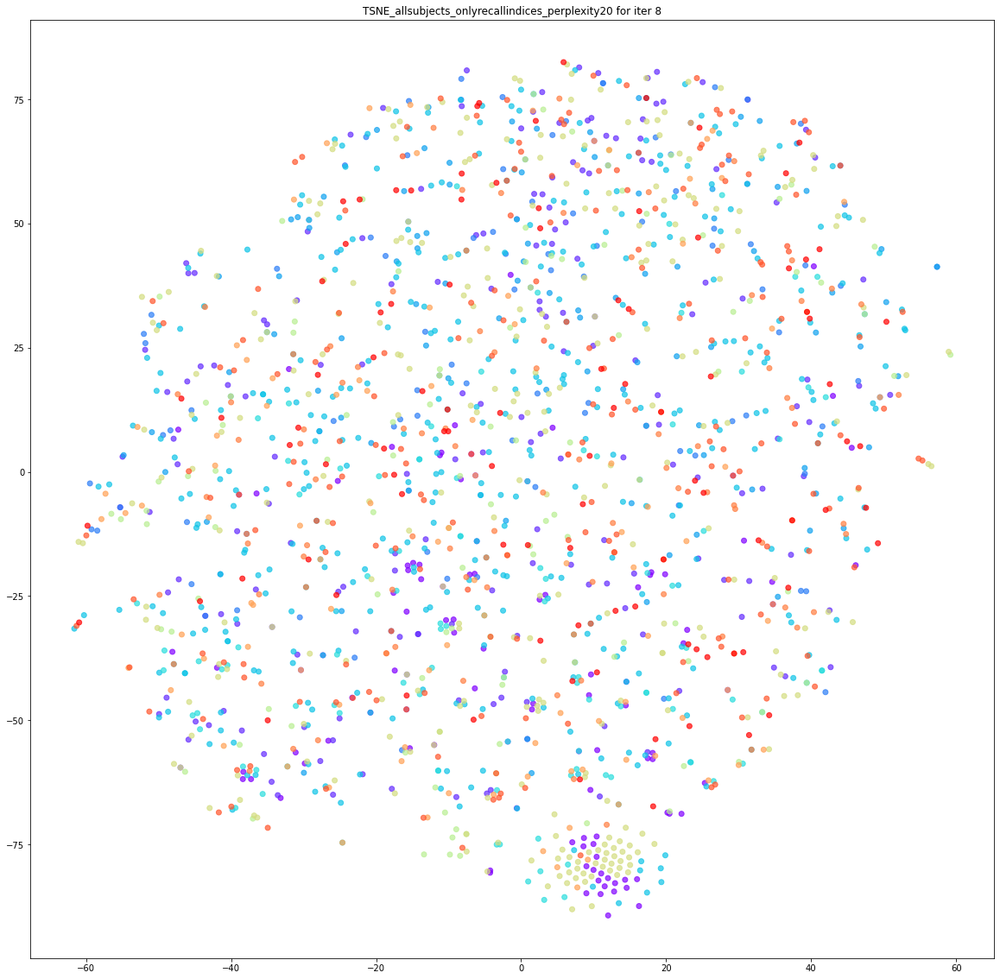

9 = [98, 191, 132, 245, 278, 63, 194, 243, 253, 99, 117, 193, 77, 253, 98, 210, 90, 186, 84, 67]


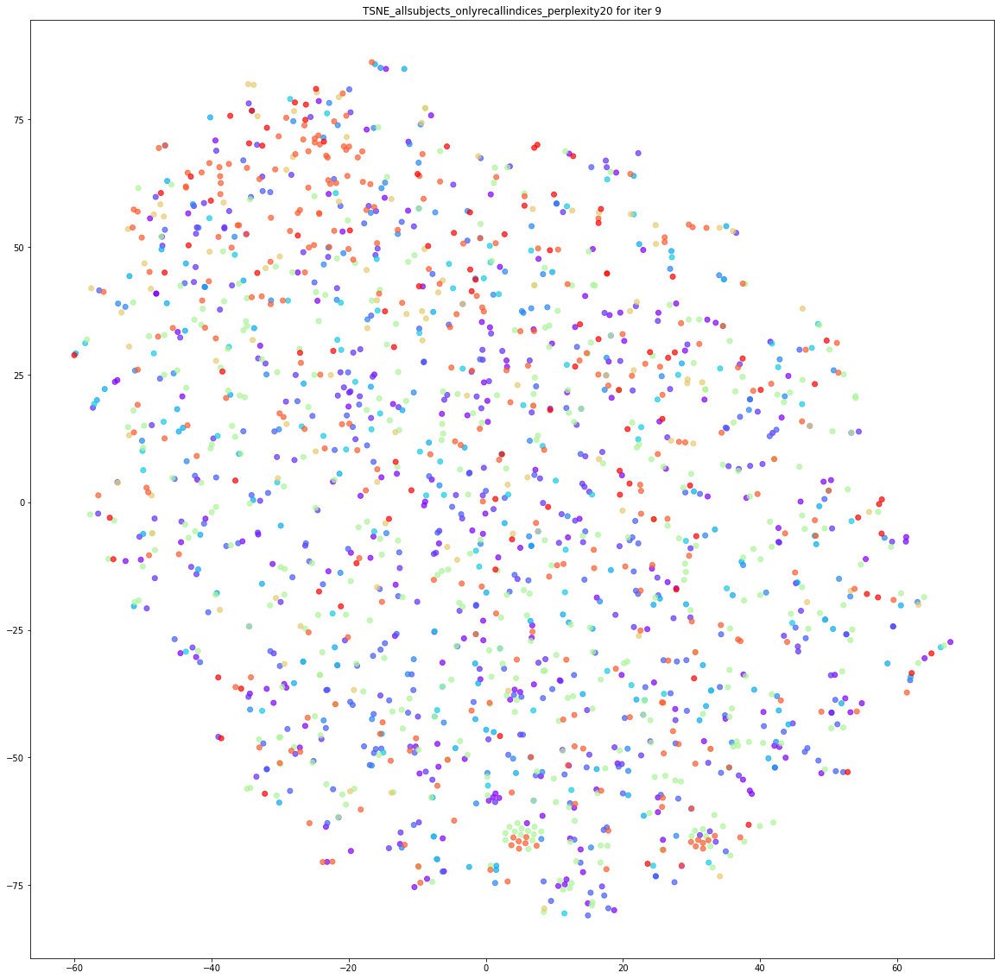

10 = [143, 140, 288, 278, 159, 187, 76, 159, 149, 141, 272, 228, 111, 149, 99, 197, 119, 293, 66, 113]


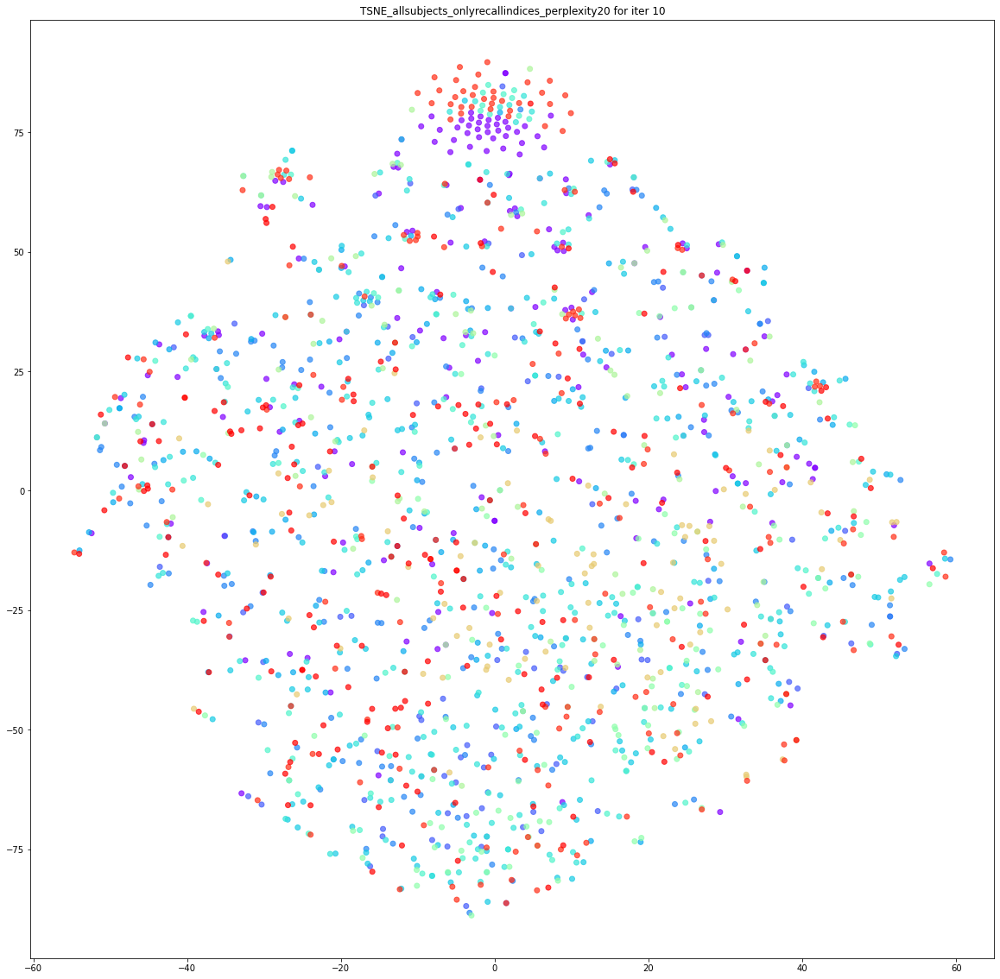

11 = [277, 243, 191, 291, 79, 105, 202, 274, 111, 127, 280, 234, 232, 210, 214, 247, 191, 274, 97, 73]


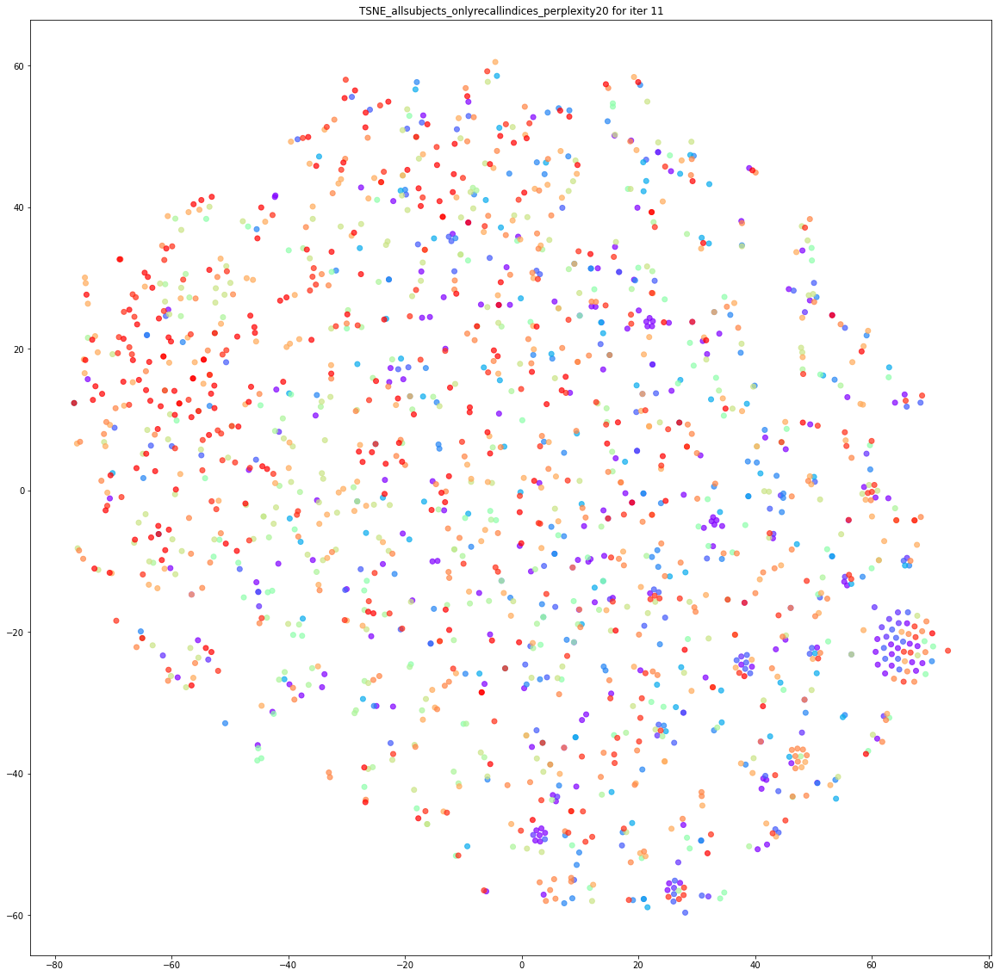

12 = [120, 155, 65, 273, 109, 291, 214, 85, 111, 259, 112, 119, 79, 136, 92, 82, 84, 252, 139, 74]


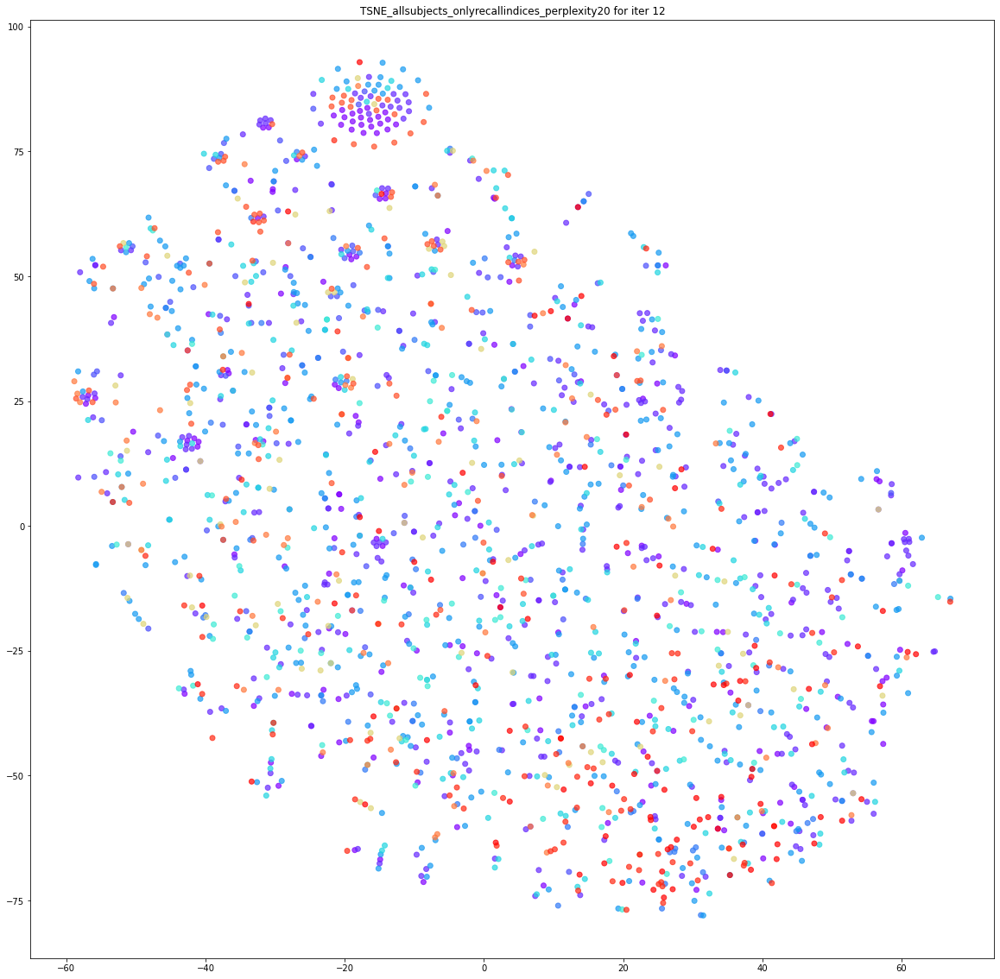

13 = [231, 290, 276, 227, 287, 277, 73, 234, 67, 108, 132, 283, 282, 70, 151, 283, 268, 211, 211, 274]


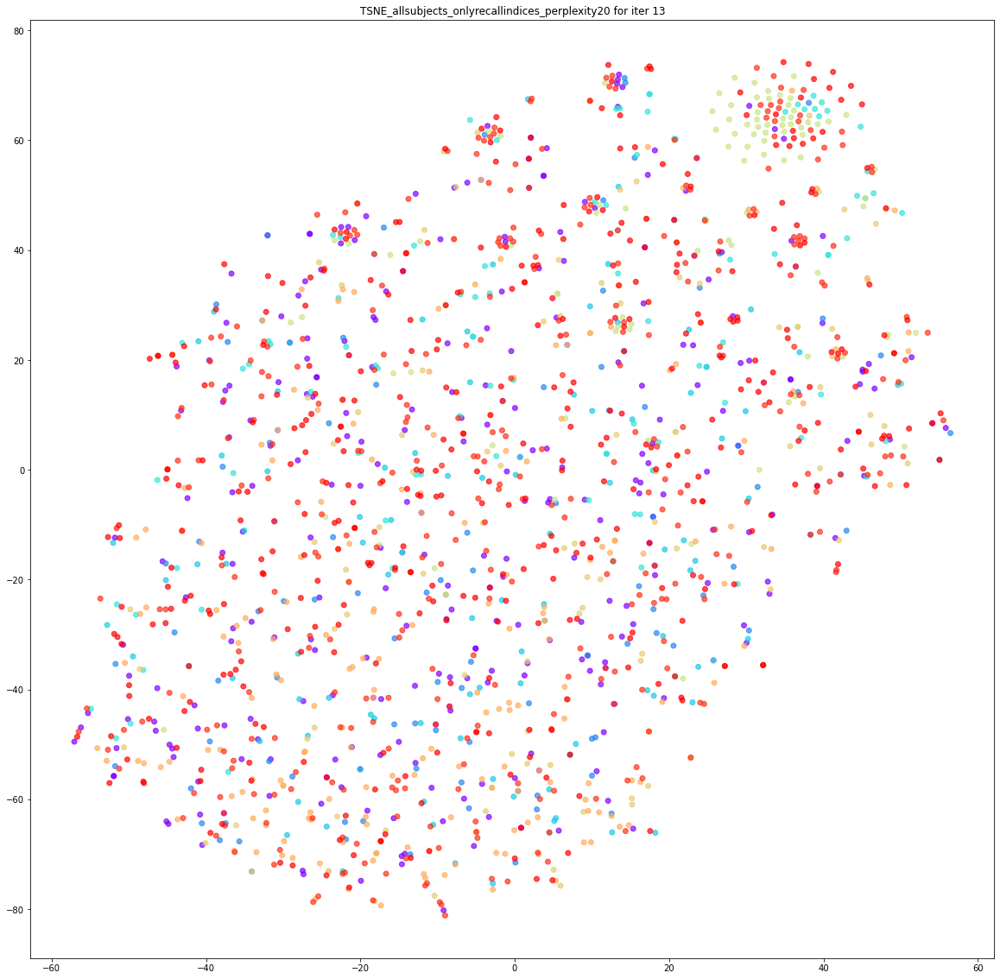

14 = [185, 192, 93, 283, 250, 73, 252, 92, 134, 130, 167, 264, 274, 281, 290, 159, 264, 292, 246, 192]


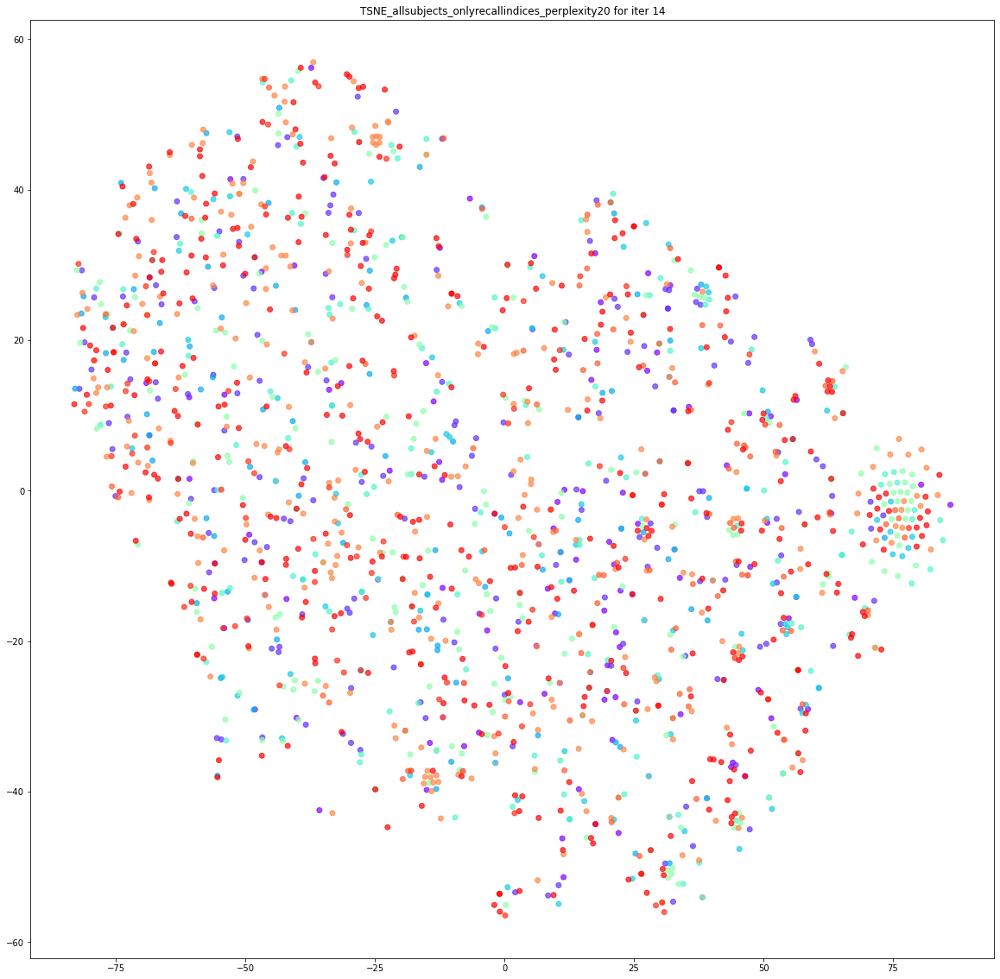

15 = [90, 159, 110, 209, 200, 94, 260, 65, 150, 248, 189, 261, 268, 88, 132, 76, 248, 146, 84, 229]


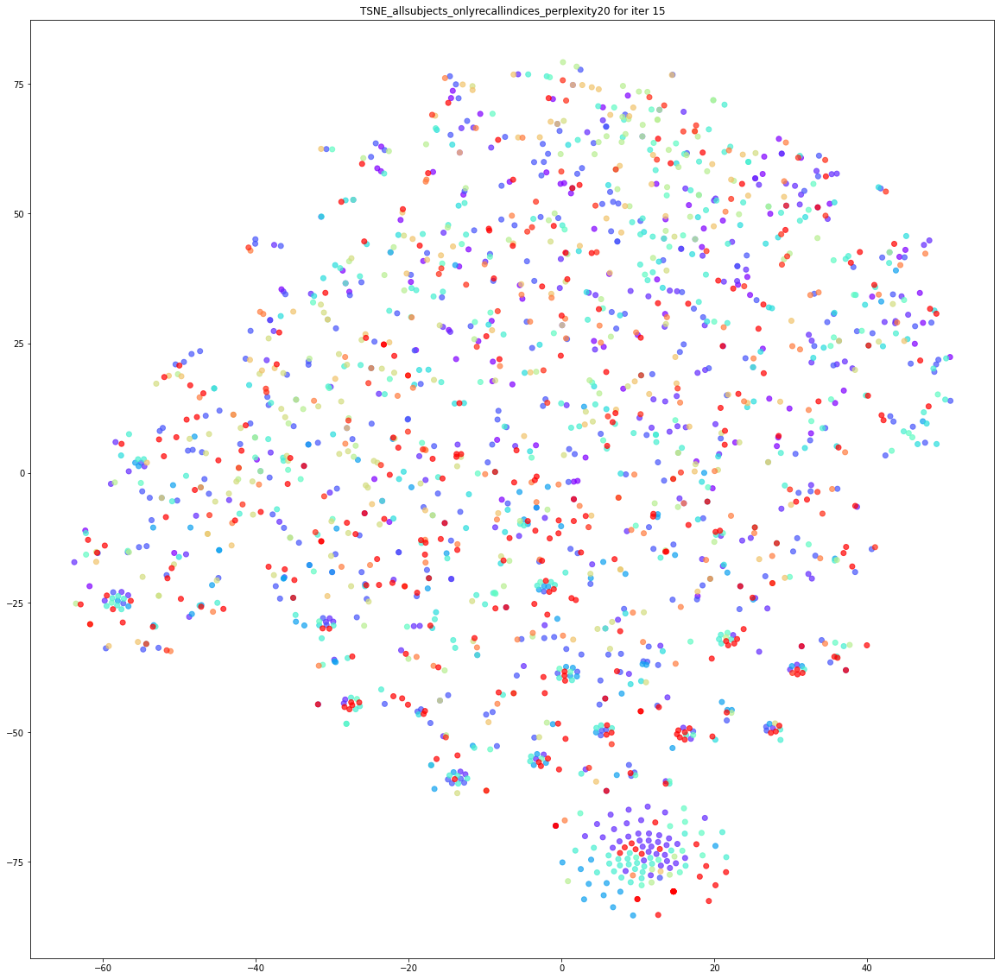

16 = [283, 239, 134, 69, 166, 121, 110, 125, 201, 259, 290, 188, 234, 115, 221, 127, 131, 153, 215, 103]


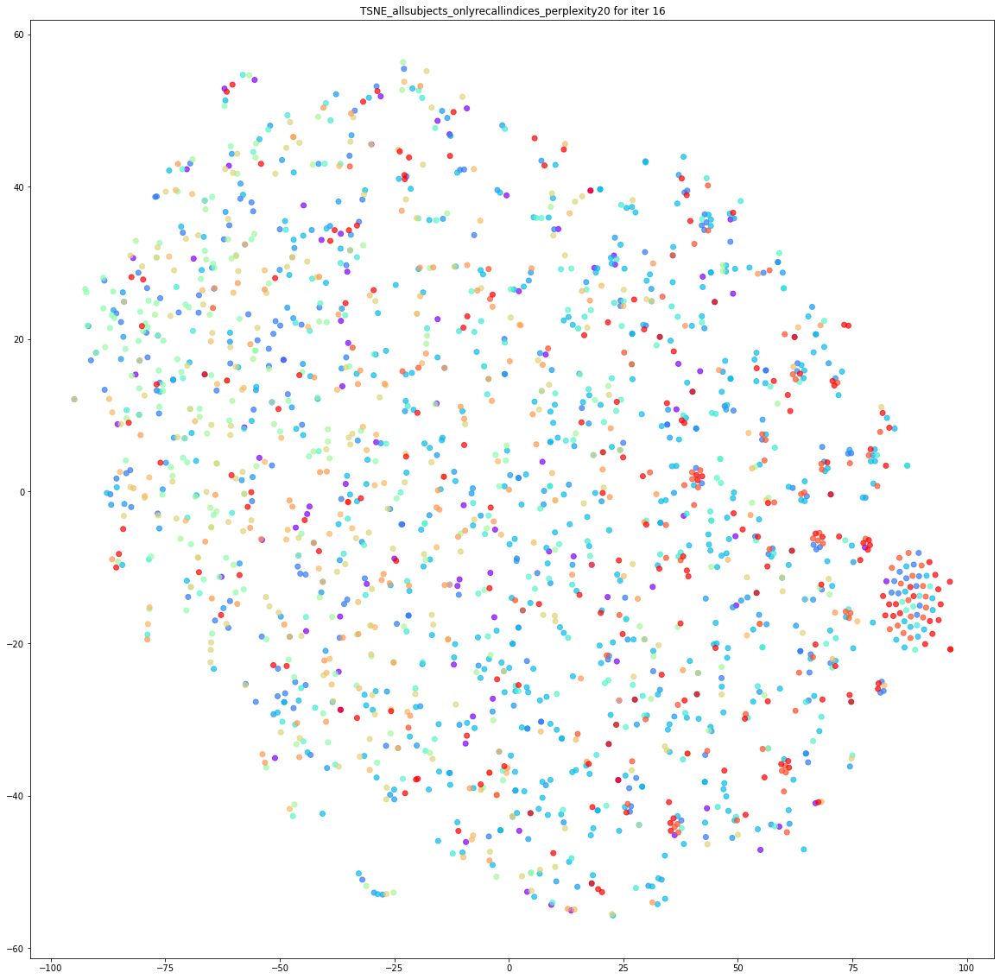

17 = [113, 186, 116, 283, 89, 126, 124, 131, 84, 194, 215, 88, 184, 229, 79, 63, 150, 121, 293, 291]


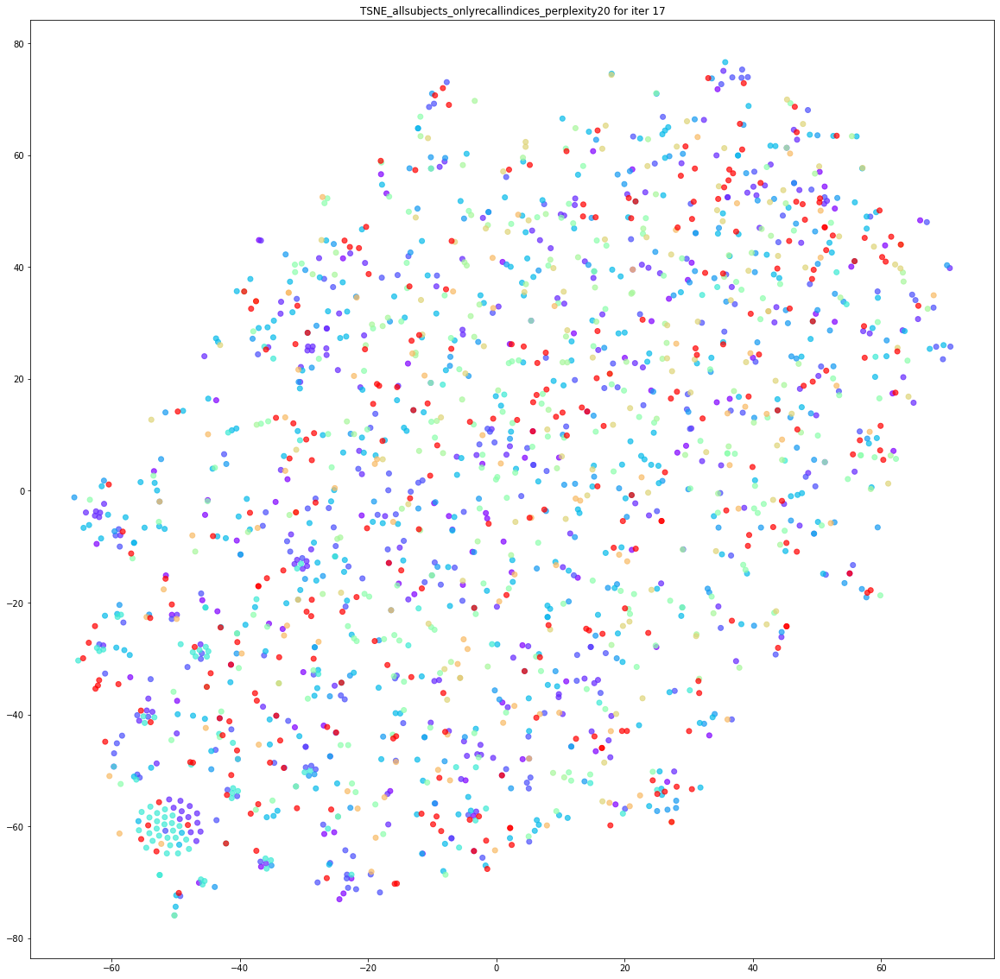

18 = [284, 114, 200, 146, 145, 187, 245, 285, 131, 150, 116, 209, 199, 273, 275, 269, 288, 233, 214, 96]


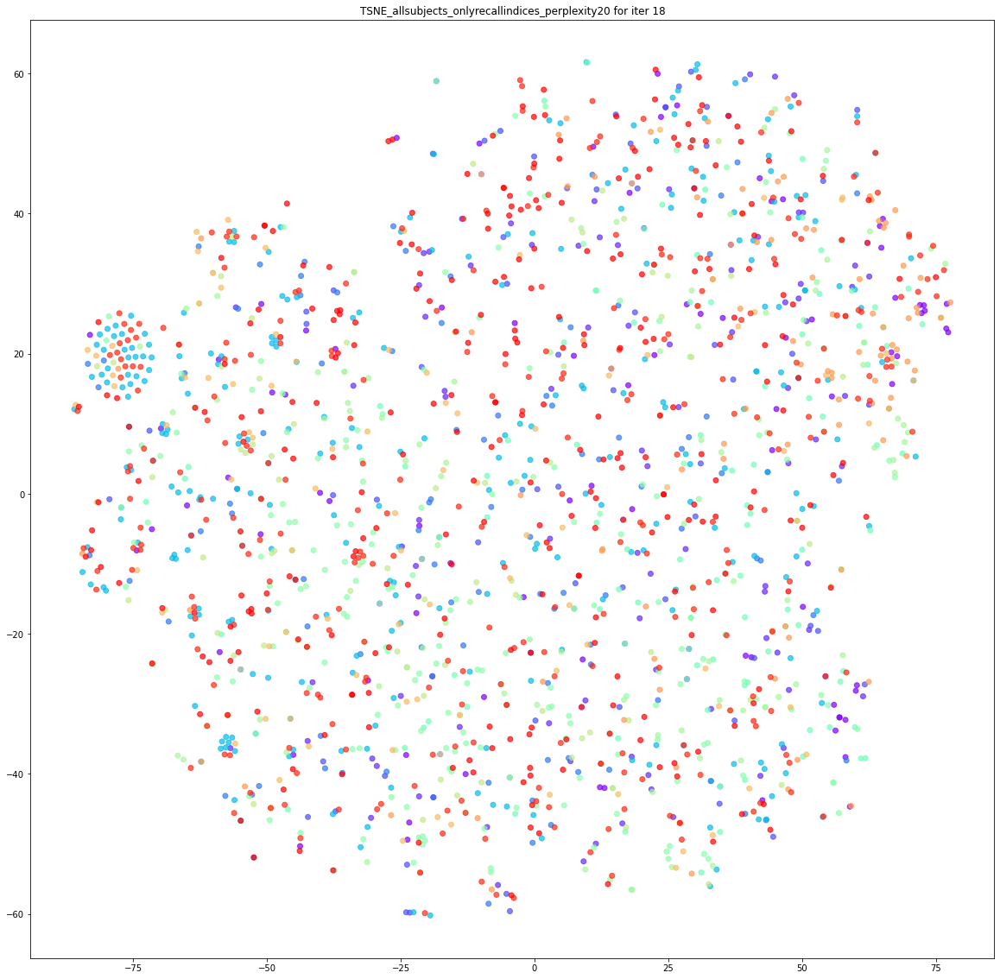

19 = [80, 279, 66, 191, 123, 267, 230, 76, 190, 121, 186, 159, 273, 292, 270, 210, 68, 93, 201, 138]


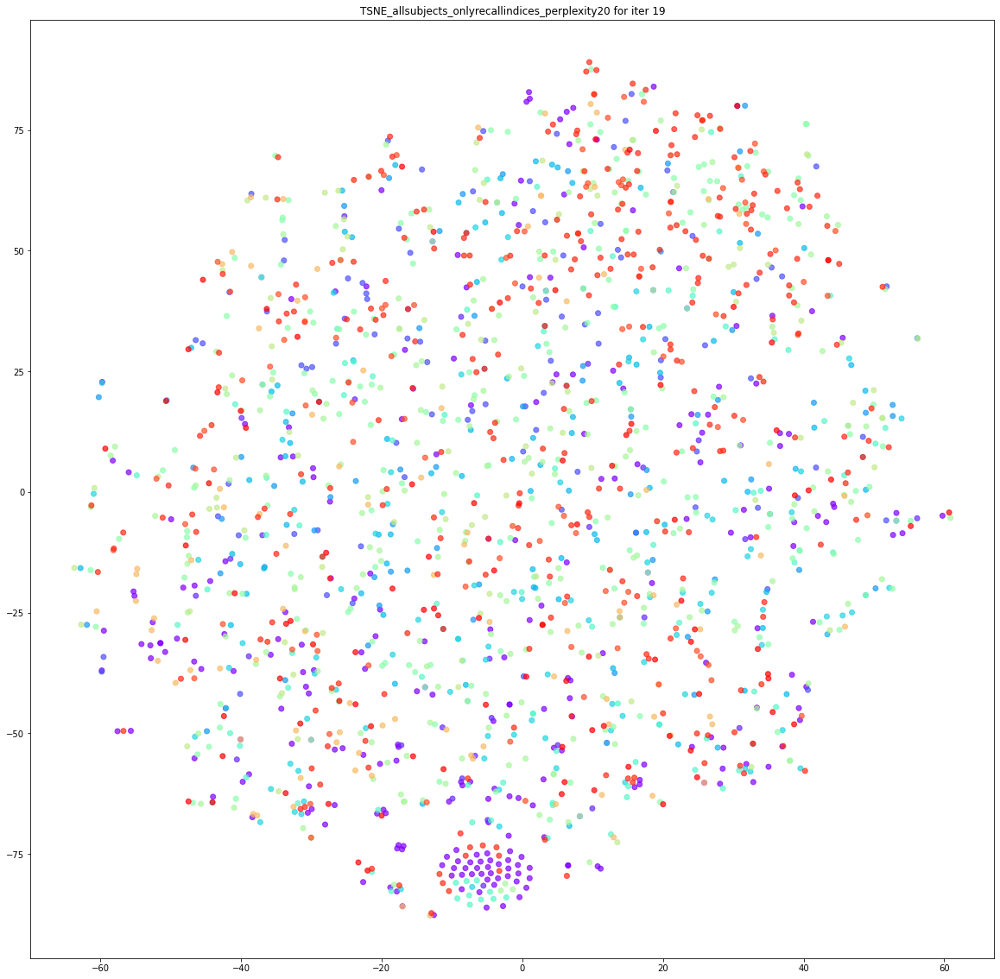

In [32]:
iterations = 20

for i in range(20):
    all_subjects = df_Allsubjects.subjectIndex.unique()
    sample_subjects = random.choices(all_subjects, k=20)
    df_sample = df_Allsubjects[df_Allsubjects.subjectIndex.isin(sample_subjects)]
    print(i,"=",sample_subjects)
    
    X = df_sample.iloc[:,3:].values
    y = df_sample.iloc[:,0].values
    tsne = TSNE(n_components=2, perplexity=20, n_iter=5000)
    projections_tsne = tsne.fit_transform(X)
    
    label = y
    totalSubjects = df_sample.subjectIndex.nunique()
    colors = cm.rainbow(np.linspace(0, 1, totalSubjects))
    
    plt.figure(figsize=(20, 20))
    plt.scatter(projections_tsne[:, 0],
                projections_tsne[:, 1], 
                c=label, 
                cmap=matplotlib.colors.ListedColormap(colors),
                alpha=0.7)
    plt.title("TSNE_allsubjects_onlyrecallindices_perplexity20 for iter "+str(i))
    plt.show()

### TASK2 - FOR TRIALS ====> recall index flags + recall order

In [28]:
### TRYING WITH JUST ALL subjects
data_json_list_subset = []
for i in data_json_list:
    if len(i)>0:
        data_json_list_subset.append(i)

### TRYING WITH JUST 10 subjects
# ids_subset = [267, 87, 151, 90, 122, 242, 110, 92, 241, 194]
# data_json_list_subset = []

# for i in data_json_list:
#     if len(i)>0:
#         if i["subjectIndex"] in ids_subset:
#             data_json_list_subset.append(i)

In [29]:
len(data_json_list_subset)

17335

In [30]:
bigList = []

for i in data_json_list_subset:
    smallList = [i["subjectIndex"] , i["sessionIndex"] , i["listIndex"]]
    recall_flags = [0]*16
    recall_indices = i["serialPositions_recallPhase"]
    recall_indices_unique = list(set(recall_indices))
    recall_order = []

    for j in recall_indices_unique:
        if j>=0:
            if j==0 or j==16:
                recall_flags[0]=1
            else:
                recall_flags[j]=1 
                    
    for j in recall_indices:
        if j>=0:
            if j==0 or j==16:
                if j not in recall_order:
                    recall_order.append(1)
            else:
                if j not in recall_order:
                    recall_order.append(j+1)                    
    
#     if len(recall_indices)>16:
#         print("\nLOOKS LIKE A BIG RECALL SEQUENCE = ",recall_indices)
#         print(recall_order)
#         print(i)
    
#     if len(recall_order)>16:
#         print("\nLOOKS LIKE A BIG RECALL ORDER = ",recall_indices)
#         print(recall_order)
#         print(i)   

    ### padding to be done if recall order is lesser than 16
    if len(recall_order)<16:
        pad_size = 16-len(recall_order)
        recall_order = recall_order + [0]*pad_size
    
    
    
    smallList += recall_flags
    smallList += recall_order
    bigList.append(smallList)
    
print(len(bigList),len(bigList[0]))    
    
cols = ['subjectIndex',
        'sessionIndex',
        'listIndex',
        'recalled_w1',
        'recalled_w2',
        'recalled_w3',
        'recalled_w4',
        'recalled_w5',
        'recalled_w6',
        'recalled_w7',
        'recalled_w8',
        'recalled_w9',
        'recalled_w10',
        'recalled_w11',
        'recalled_w12',
        'recalled_w13',
        'recalled_w14',
        'recalled_w15',
        'recalled_w16',
        'recall_order_1',
        'recall_order_2',    
        'recall_order_3',
        'recall_order_4',          
        'recall_order_5',
        'recall_order_6',    
        'recall_order_7',
        'recall_order_8',               
        'recall_order_9',
        'recall_order_10',    
        'recall_order_11',
        'recall_order_12',          
        'recall_order_13',
        'recall_order_14',    
        'recall_order_15',
        'recall_order_16']

df_Allsubjects = pd.DataFrame(bigList, columns = cols)

print(df_Allsubjects.shape)

17335 35
(17335, 35)


In [31]:
df_Allsubjects.head(3)

,subjectIndex,sessionIndex,listIndex,recalled_w1,recalled_w2,recalled_w3,recalled_w4,recalled_w5,recalled_w6,recalled_w7,recalled_w8,recalled_w9,recalled_w10,recalled_w11,recalled_w12,recalled_w13,recalled_w14,recalled_w15,recalled_w16,recall_order_1,recall_order_2,recall_order_3,recall_order_4,recall_order_5,recall_order_6,recall_order_7,recall_order_8,recall_order_9,recall_order_10,recall_order_11,recall_order_12,recall_order_13,recall_order_14,recall_order_15,recall_order_16
0,63,1,0,1,1,1,0,0,0,1,0,0,1,0,0,0,1,0,1,16,14,7,2,1,10,0,0,0,0,0,0,0,0,0,0
1,63,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,1,16,14,13,2,0,0,0,0,0,0,0,0,0,0,0,0
2,63,1,2,0,1,1,0,1,1,1,0,0,1,0,0,0,0,1,1,15,3,6,2,10,5,0,0,0,0,0,0,0,0,0,0


In [32]:
X = df_Allsubjects.iloc[:,3:].values
y = df_Allsubjects.iloc[:,0].values

In [113]:
tsne = TSNE(n_components=2, perplexity=30, n_iter=5000, verbose=3)

In [114]:
projections_tsne = tsne.fit_transform(X)

/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 17335 samples in 0.002s...
[t-SNE] Computed neighbors for 17335 samples in 5.271s...
[t-SNE] Computed conditional probabilities for sample 1000 / 17335
[t-SNE] Computed conditional probabilities for sample 2000 / 17335
[t-SNE] Computed conditional probabilities for sample 3000 / 17335
[t-SNE] Computed conditional probabilities for sample 4000 / 17335
[t-SNE] Computed conditional probabilities for sample 5000 / 17335
[t-SNE] Computed conditional probabilities for sample 6000 / 17335
[t-SNE] Computed conditional probabilities for sample 7000 / 17335
[t-SNE] Computed conditional probabilities for sample 8000 / 17335
[t-SNE] Computed conditional probabilities for sample 9000 / 17335
[t-SNE] Computed conditional probabilities for sample 10000 / 17335
[t-SNE] Computed conditional probabilities for sample 11000 / 17335
[t-SNE] Computed conditional probabilities for sample 12000 / 17335
[t-SNE] Computed conditional probabilities for sam

In [115]:
type(projections_tsne)

numpy.ndarray

In [116]:
projections_tsne.shape

(17335, 2)

In [117]:
label = y
totalSubjects = df_Allsubjects.subjectIndex.nunique()
colors = cm.rainbow(np.linspace(0, 1, totalSubjects))

totalSubjects

186

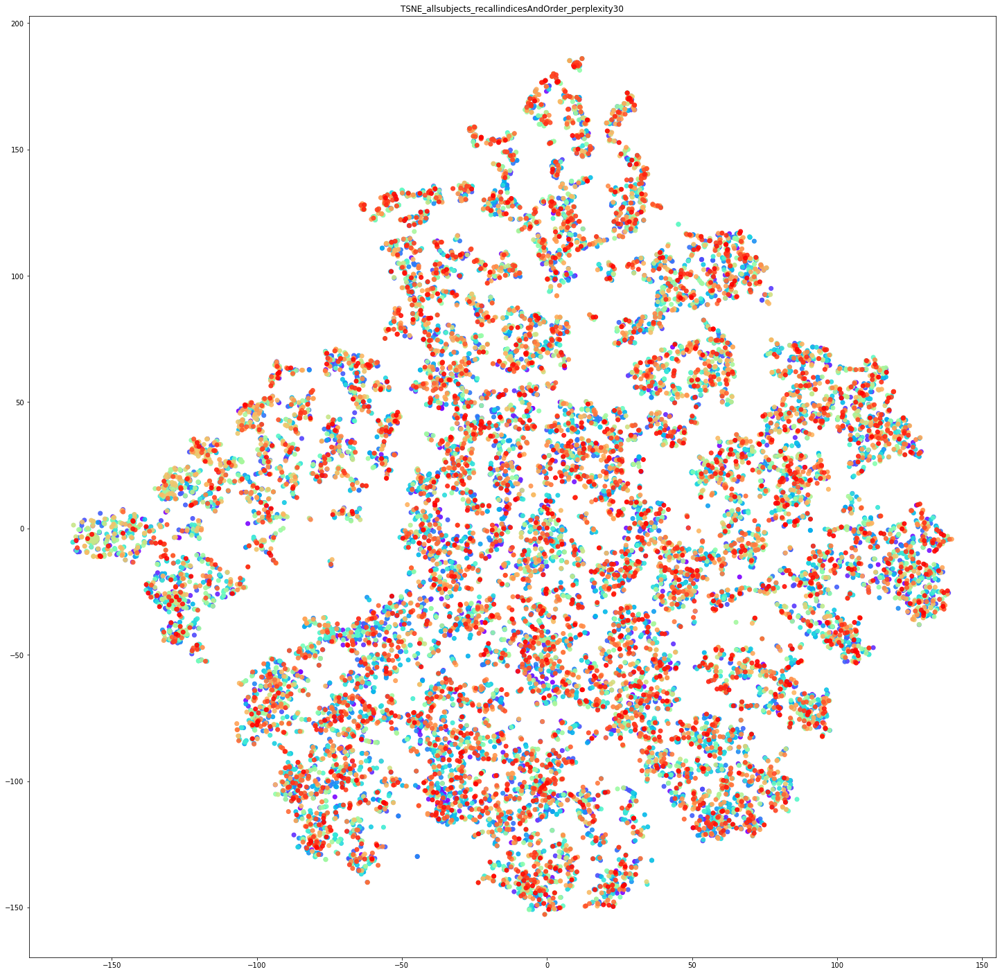

In [118]:
plt.figure(figsize=(25, 25))
plt.scatter(projections_tsne[:, 0],
            projections_tsne[:, 1], 
            c=label, cmap=matplotlib.colors.ListedColormap(colors),alpha=0.9)
plt.title("TSNE_allsubjects_recallindicesAndOrder_perplexity30")
plt.show()

In [112]:
### selecting random 10 subjects 10 times to check stability
### we see few users have this pattern of blob

0 = [281, 241, 113, 134, 202, 79, 278, 130, 81, 125]


/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


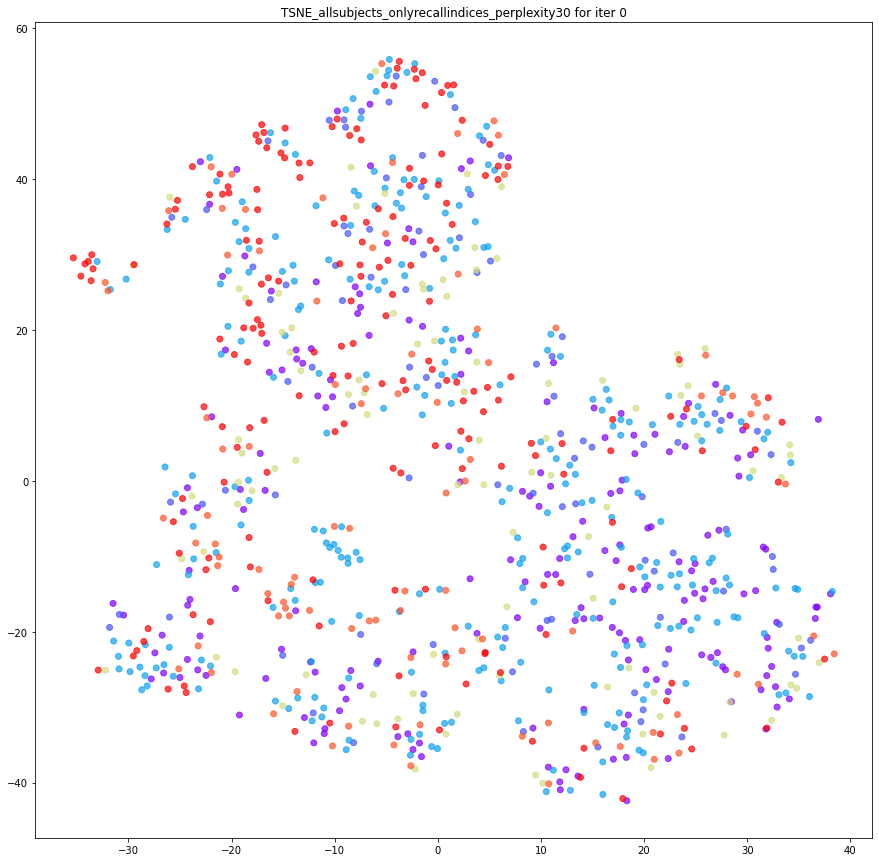

1 = [264, 132, 285, 237, 252, 207, 249, 137, 280, 274]


/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


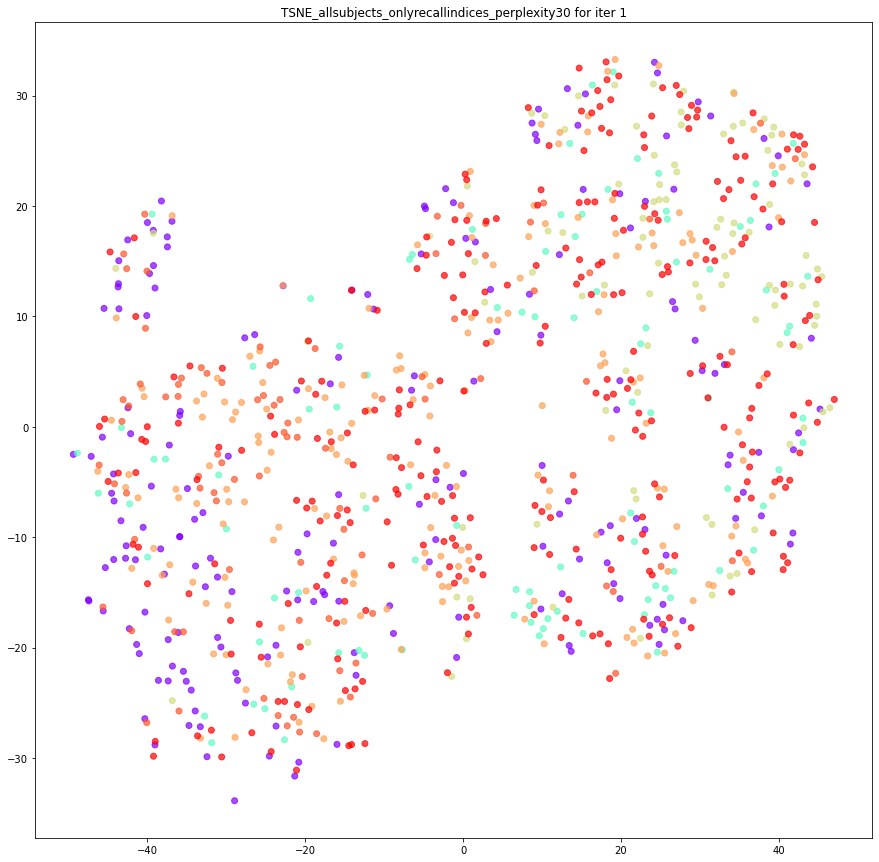

2 = [75, 245, 89, 281, 167, 239, 286, 77, 250, 74]


/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


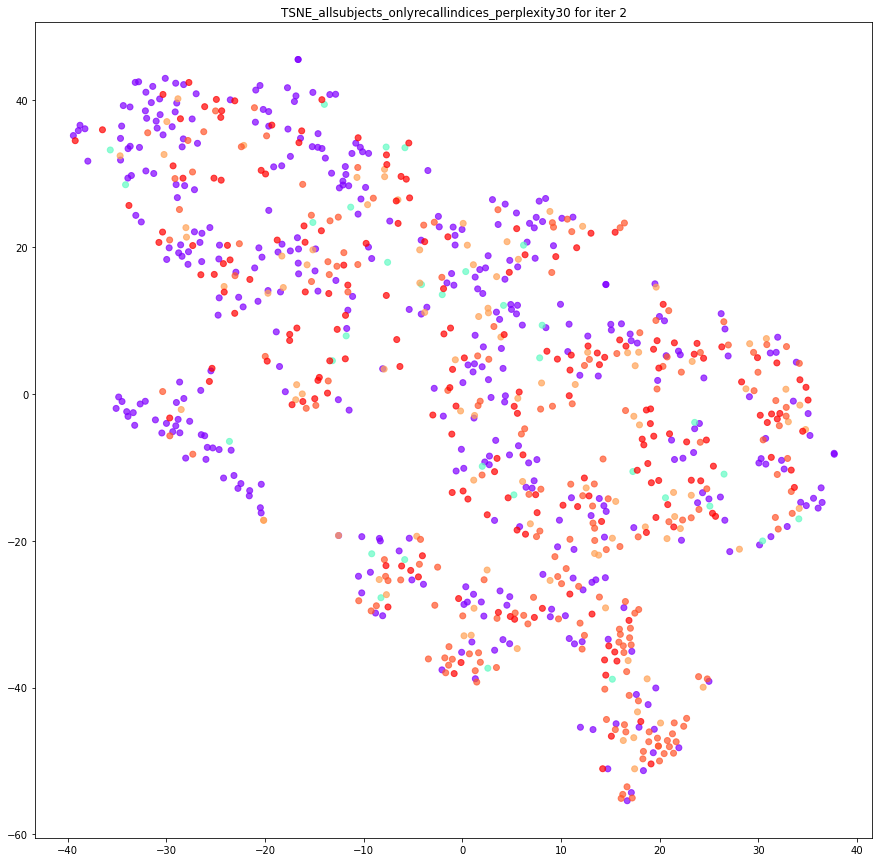

3 = [258, 88, 232, 87, 190, 70, 231, 184, 292, 87]


/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


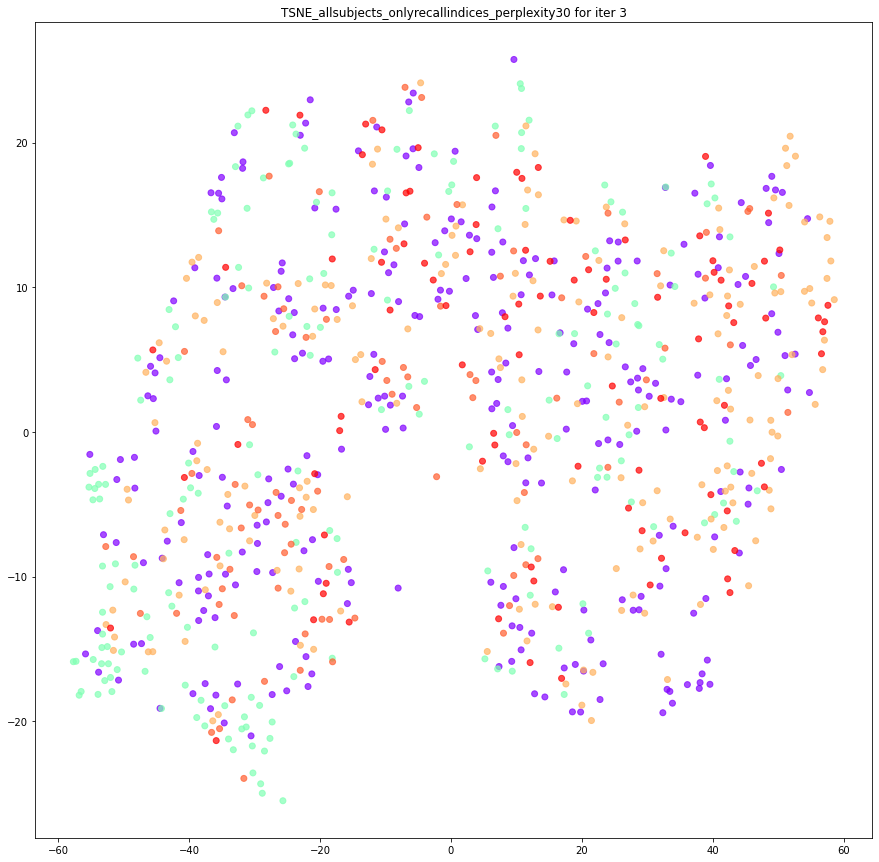

4 = [227, 112, 103, 199, 240, 134, 185, 112, 278, 135]


/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


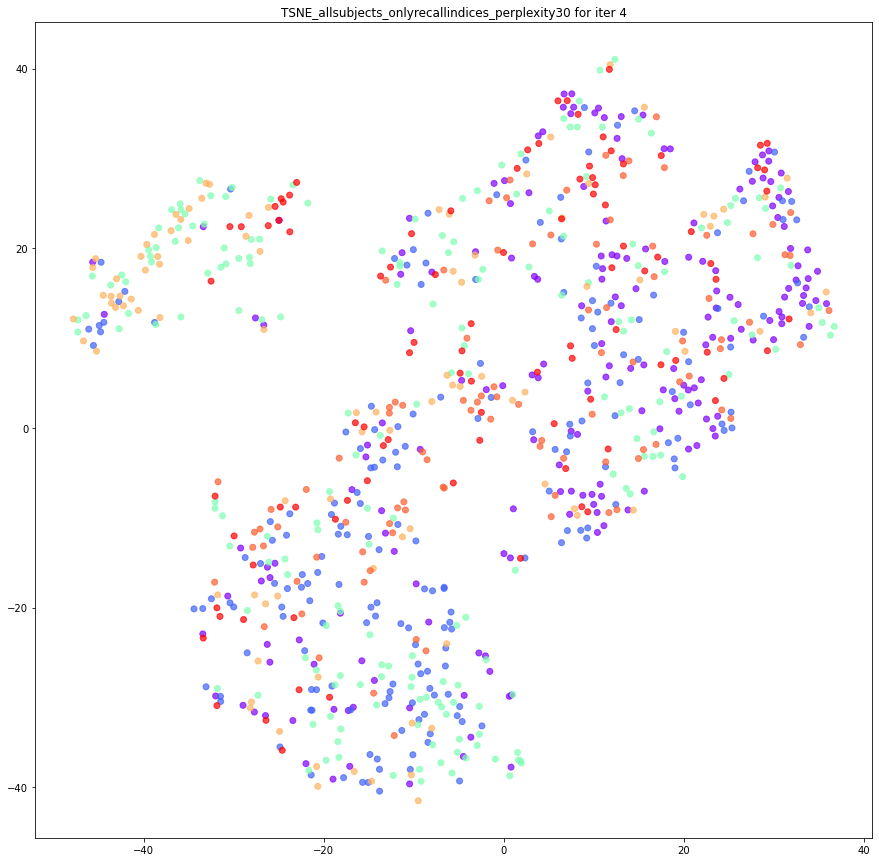

5 = [80, 114, 228, 123, 263, 243, 96, 260, 87, 121]


/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


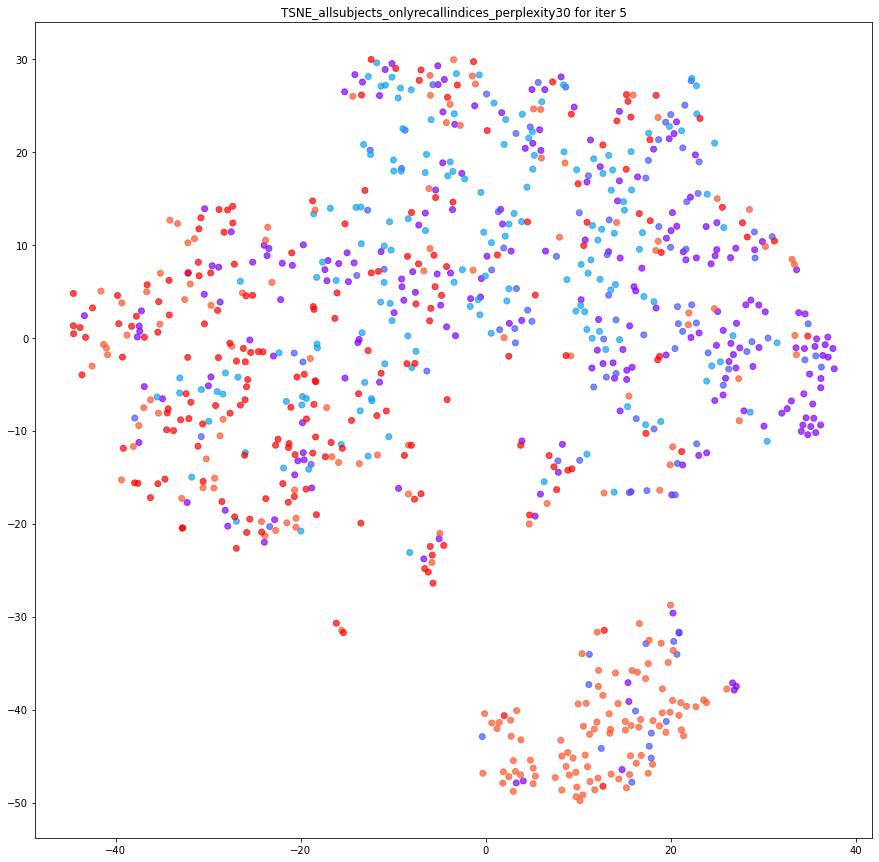

6 = [134, 75, 267, 271, 86, 239, 275, 81, 242, 104]


/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


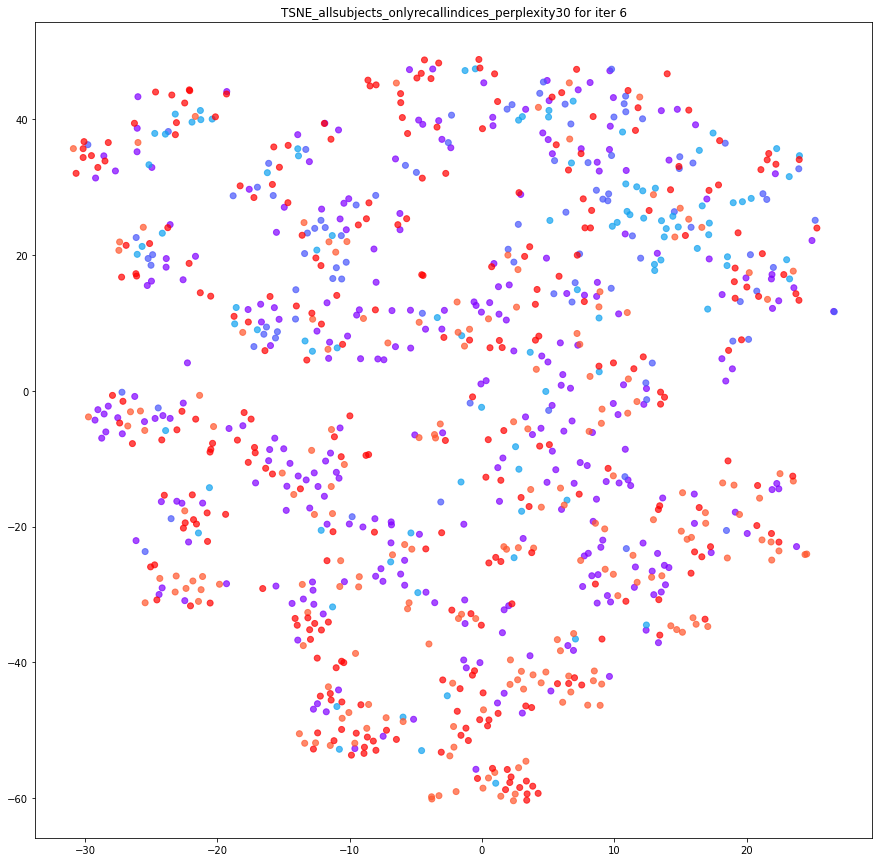

7 = [167, 65, 271, 201, 188, 234, 75, 64, 272, 246]


/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


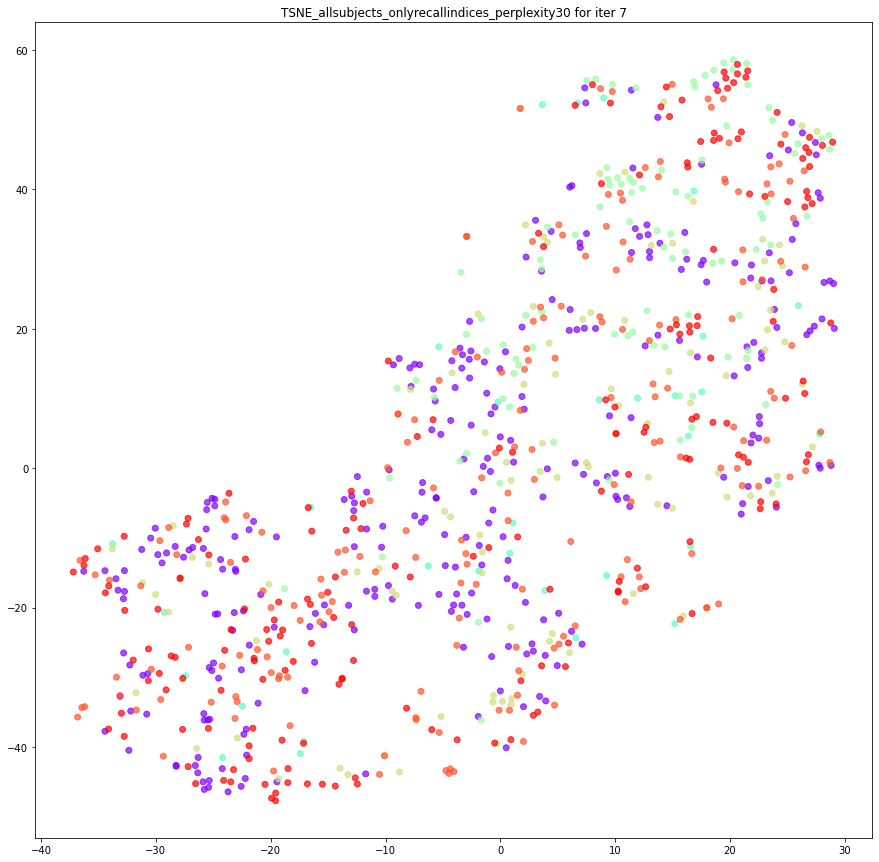

8 = [98, 140, 126, 289, 104, 214, 67, 118, 233, 69]


/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


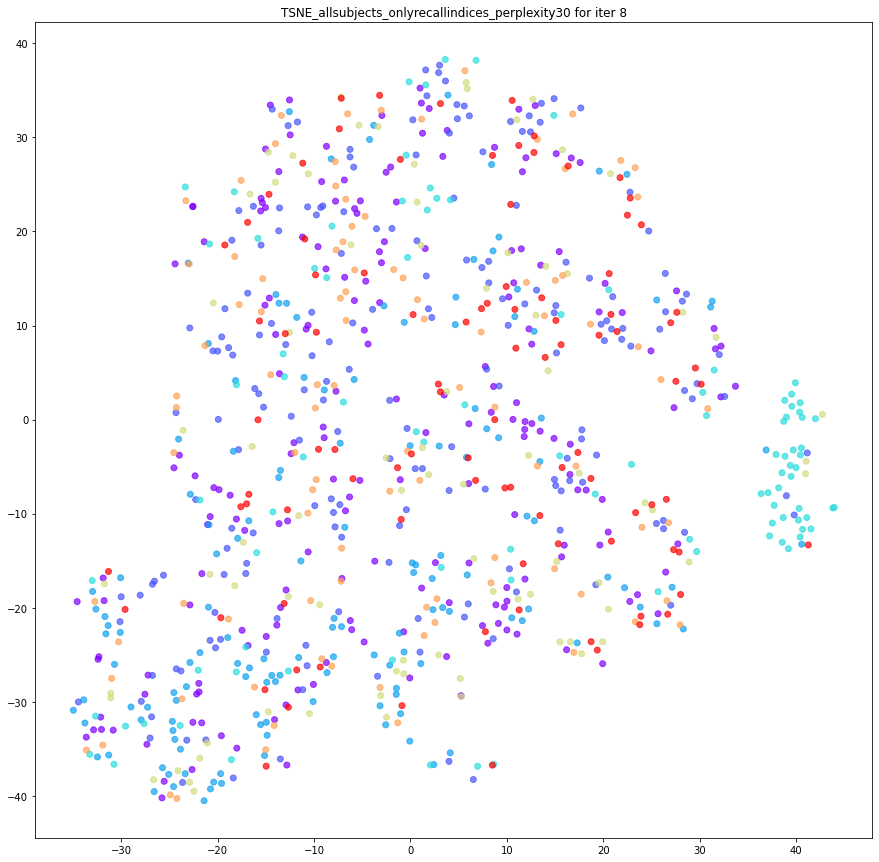

9 = [148, 153, 247, 193, 69, 254, 254, 119, 269, 97]


/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/sidkoch/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


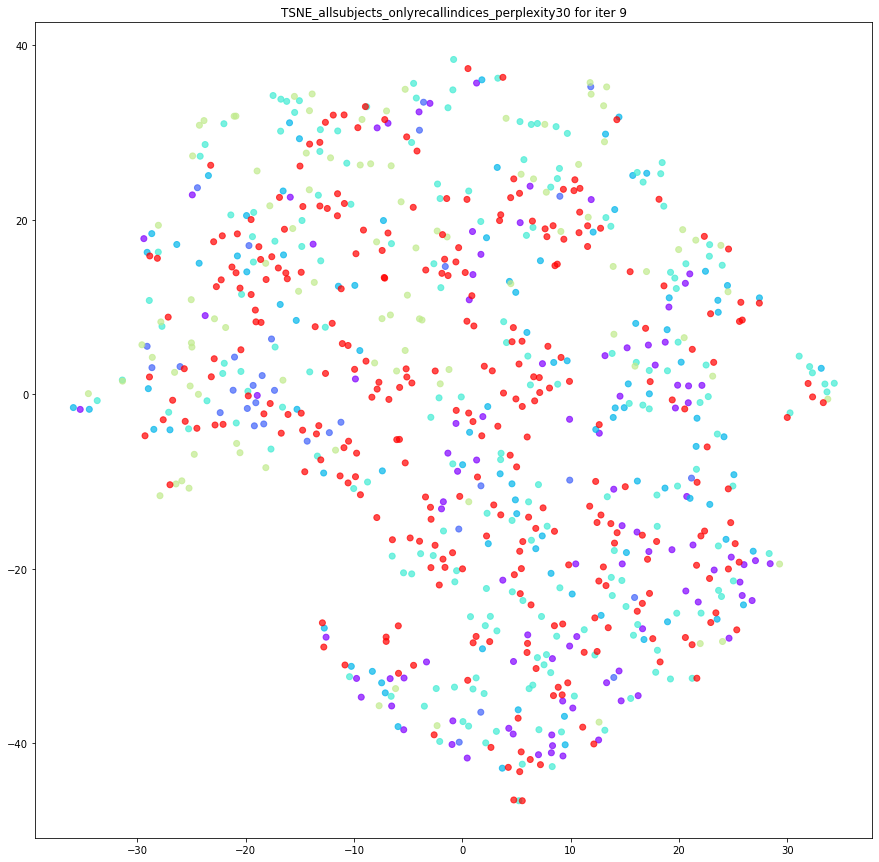

In [120]:
iterations = 10

for i in range(10):
    all_subjects = df_Allsubjects.subjectIndex.unique()
    sample_subjects = random.choices(all_subjects, k=10)
    df_sample = df_Allsubjects[df_Allsubjects.subjectIndex.isin(sample_subjects)]
    print(i,"=",sample_subjects)
    
    X = df_sample.iloc[:,3:].values
    y = df_sample.iloc[:,0].values
    tsne = TSNE(n_components=2, perplexity=30, n_iter=5000)
    projections_tsne = tsne.fit_transform(X)
    
    label = y
    totalSubjects = df_sample.subjectIndex.nunique()
    colors = cm.rainbow(np.linspace(0, 1, totalSubjects))
    
    plt.figure(figsize=(15, 15))
    plt.scatter(projections_tsne[:, 0],
                projections_tsne[:, 1], 
                c=label, 
                cmap=matplotlib.colors.ListedColormap(colors),
                alpha=0.7)
    plt.title("TSNE_allsubjects_onlyrecallindices_perplexity30 for iter "+str(i))
    plt.show()